- Projeto sobre a análise dos dados de testes rápido de COVID-19, com o uso de machine learning.
- Esté o código do grupo LIFE-DATA, do Instituto D'vinci3, dados disponibilizados pelo Instituto Butantan.
- Alguns testes foram feitos de maneira "manual", porém, após uma discussão, optamos por uma função, para agilizar a análise da equipe de cientistas de dados do Instituto Butantan para se ter um melhor entendimentoo do tema.
- O código passou por algumas modificações desde a apresentação do dia 12/01/2022, trazendo novos resultados e novas interpretações tendo fim como aprimoramento do resultado.
- É necessário rodar todos os passos na ordem apresentada.

# Import

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import scikitplot as skplt

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from numpy import argmax

# Dataset

In [2]:
df = pd.read_csv(r"C:\Users\erick\OneDrive\Documentos\GitHub\IDV3---Data-Life\data_set_butanta.csv", sep=',')
df.head()


,result_igm,age_category,sex,conjunctivitis.x,asymptomatic.x,abdomen_pain.x,chills.x,diarrhea.x,missing_smell.x,missing_tasty.x,...,missing_smell.y,missing_tasty.y,nausea.y,body_pain.y,cough.y,fever.y,hard_breathe.y,head_pain.y,running_nose.y,throat_pain.y
0,0,5,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,2,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,5,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,6,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0


In [3]:
df.columns

Index(['result_igm', 'age_category', 'sex', 'conjunctivitis.x',
       'asymptomatic.x', 'abdomen_pain.x', 'chills.x', 'diarrhea.x',
       'missing_smell.x', 'missing_tasty.x', 'nausea.x', 'body_pain.x',
       'cough.x', 'fever.x', 'hard_breathe.x', 'head_pain.x', 'running_nose.x',
       'throat_pain.x', 'conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
       'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
       'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
       'head_pain.y', 'running_nose.y', 'throat_pain.y'],
      dtype='object')

In [4]:
df1 = pd.read_csv(r"C:\Users\erick\OneDrive\Documentos\GitHub\IDV3---Data-Life\data_set_butanta.csv", sep=',')
df1.head()


,result_igm,age_category,sex,conjunctivitis.x,asymptomatic.x,abdomen_pain.x,chills.x,diarrhea.x,missing_smell.x,missing_tasty.x,...,missing_smell.y,missing_tasty.y,nausea.y,body_pain.y,cough.y,fever.y,hard_breathe.y,head_pain.y,running_nose.y,throat_pain.y
0,0,5,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,2,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,5,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,6,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0


In [5]:
df1.drop('result_igm', axis=1, inplace=True)

In [6]:
df.drop(['conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
        'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
        'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
        'head_pain.y', 'running_nose.y', 'throat_pain.y'], axis=1, inplace=True)

In [7]:
df.columns

Index(['result_igm', 'age_category', 'sex', 'conjunctivitis.x',
       'asymptomatic.x', 'abdomen_pain.x', 'chills.x', 'diarrhea.x',
       'missing_smell.x', 'missing_tasty.x', 'nausea.x', 'body_pain.x',
       'cough.x', 'fever.x', 'hard_breathe.x', 'head_pain.x', 'running_nose.x',
       'throat_pain.x'],
      dtype='object')

In [8]:
df1.drop(['conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
        'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
        'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
        'head_pain.y', 'running_nose.y', 'throat_pain.y'], axis=1, inplace=True)

In [9]:
df1.columns

Index(['age_category', 'sex', 'conjunctivitis.x', 'asymptomatic.x',
       'abdomen_pain.x', 'chills.x', 'diarrhea.x', 'missing_smell.x',
       'missing_tasty.x', 'nausea.x', 'body_pain.x', 'cough.x', 'fever.x',
       'hard_breathe.x', 'head_pain.x', 'running_nose.x', 'throat_pain.x'],
      dtype='object')

In [10]:
df['result_igm'].value_counts()

0    1120640
1      71657
Name: result_igm, dtype: int64

# Scaler e definição de variáveis

In [11]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(df1)

In [12]:
X = scaled_X

In [13]:
X

array([[ 0.23978292,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [-1.59855278,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.23978292, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       ...,
       [-0.98577422, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.23978292,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.85256148, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665]])

In [14]:
y = df['result_igm']

# Random Forest (Manual)

In [15]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
print(f"Estatísticas do target y: {Counter(y_train)}")
print(f"Estatísticas do target X: {Counter(y_test)}")

Estatísticas do target y: Counter({0: 784451, 1: 50156})
Estatísticas do target X: Counter({0: 336189, 1: 21501})


In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [17]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 751001, 1: 47837}))

In [18]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [19]:
y_pred = rfc.predict(X_test)

In [20]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369639
           1       0.20      0.01      0.01     23820

    accuracy                           0.94    393459
   macro avg       0.57      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [21]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [22]:
print(confusion_matrix(y_test, y_pred))

[[368906    733]
 [ 23639    181]]


In [23]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9380570783741127


In [24]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.014635724104471576


In [25]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.95846109 0.04153891]
 [0.890042   0.109958  ]
 [0.91767443 0.08232557]
 ...
 [0.93690648 0.06309352]
 [0.95846109 0.04153891]
 [0.95466742 0.04533258]]


In [26]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [27]:
roc_auc0 = auc(fpr0, tpr0)

In [28]:
thresholds

array([1.99555556e+00, 9.95555556e-01, 9.67500000e-01, ...,
       1.00000000e-04, 7.09219858e-05, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [29]:
J = tpr0 - fpr0
print(J)



[ 0.00000000e+00  3.92761859e-05  8.12577140e-05 ... -2.64136941e-03
 -2.65219078e-03  0.00000000e+00]


In [30]:
ix = argmax(J)
print(ix)

6467


In [31]:
cm1 = (confusion_matrix(y_test, y_pred))

In [32]:
cm1

array([[368906,    733],
       [ 23639,    181]], dtype=int64)

In [33]:
cm1[0,0]


368906

In [34]:
cm1[1,1]

181

In [35]:
cm1[0,1]

733

In [36]:
cm1[1,0]

23639

In [37]:
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

In [38]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.04153891]
 [0.         0.109958  ]
 [0.         0.08232557]
 ...
 [0.         0.06309352]
 [0.         0.04153891]
 [0.         0.04533258]]


# Resultado Random Forest

In [39]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369639
           1       0.20      0.01      0.01     23820

    accuracy                           0.94    393459
   macro avg       0.57      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[368906    733]
 [ 23639    181]]
A acurácia do modelo: 0.9380570783741127
Valor do F1-score: 0.014635724104471576
Valor da sensibilidade: 0.007598656591099916
Valor da especificação: 0.9980169841385784


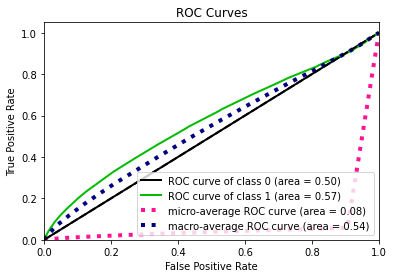

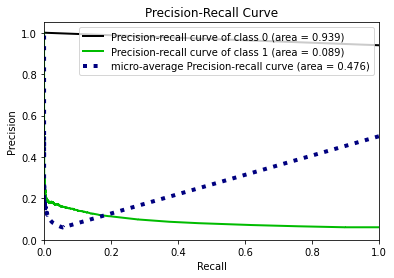

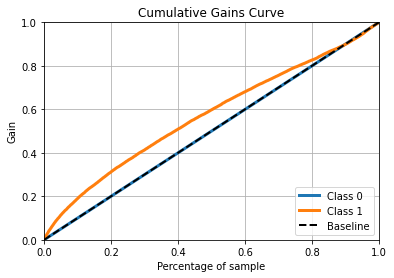

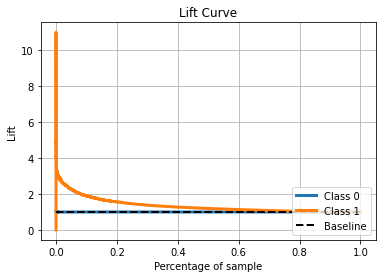

In [40]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

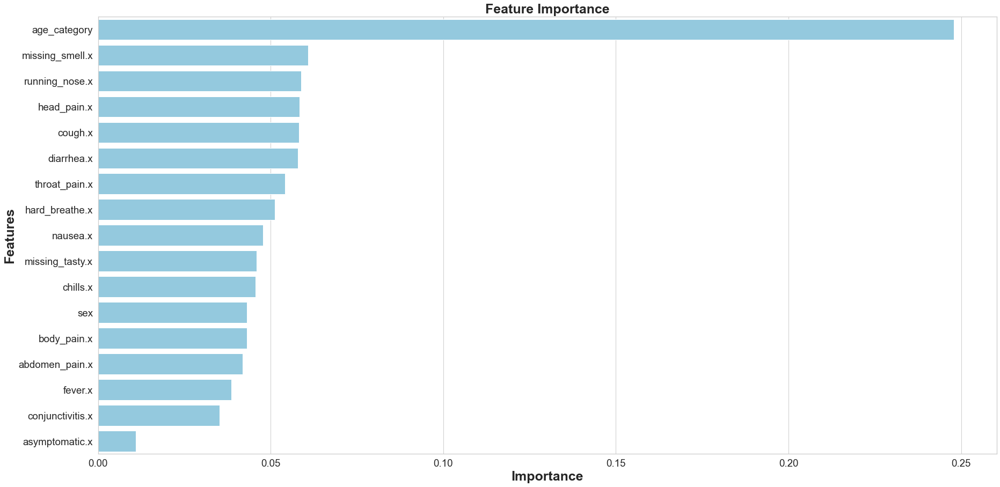

None

,Features,Gini-Importance
0,age_category,0.247870
1,missing_smell.x,0.060794
2,running_nose.x,0.058886
3,head_pain.x,0.058425
4,cough.x,0.058256
5,diarrhea.x,0.057928
6,throat_pain.x,0.054234
7,hard_breathe.x,0.051289
8,nausea.x,0.047851
9,missing_tasty.x,0.045869


In [41]:
feats = {}
for feature, importance in zip(df1.columns, rfc.feature_importances_):
    feats[feature] = importance
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index()
importances = importances.rename(columns={'index': 'Features'})
sns.set(font_scale = 5)
sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
fig, ax = plt.subplots()
fig.set_size_inches(30,15)
sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
plt.xlabel('Importance', fontsize=25, weight = 'bold')
plt.ylabel('Features', fontsize=25, weight = 'bold')
plt.title('Feature Importance', fontsize=25, weight = 'bold')
display(plt.show())
display(importances)

# Random Forest (Manual)
- (Random Over Sampler)

In [42]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\erick\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip' command.


In [43]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(sampling_strategy = 'minority', random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)

In [44]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_res, y_res)

RandomForestClassifier(criterion='entropy')

In [45]:
y_pred = rfc.predict(X_test)

In [46]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.75      0.84    369639
           1       0.08      0.35      0.14     23820

    accuracy                           0.73    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.73      0.80    393459



In [47]:
print(confusion_matrix(y_test, y_pred))

[[277898  91741]
 [ 15410   8410]]


In [48]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.7276692107691017


In [49]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.13567689217639609


In [50]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.59398764 0.40601236]
 [0.35726703 0.64273297]
 [0.41028924 0.58971076]
 ...
 [0.48469071 0.51530929]
 [0.59398764 0.40601236]
 [0.57341107 0.42658893]]


In [51]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [52]:
roc_auc0 = auc(fpr0, tpr0)

In [53]:
thresholds

array([2.00000000e+00, 1.00000000e+00, 9.89126740e-01, ...,
       1.01449275e-03, 9.16666667e-04, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [54]:
J = tpr0 - fpr0
print(J)

[ 0.          0.00324747  0.00333143 ... -0.00193946 -0.00191371
  0.        ]


In [55]:
ix = argmax(J)
print(ix)

4006


In [56]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.40601236]
 [0.         0.64273297]
 [0.         0.58971076]
 ...
 [0.         0.51530929]
 [0.         0.40601236]
 [0.         0.42658893]]


In [57]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 751001, 1: 751001})
Testing target statistics: Counter({0: 369639, 1: 23820})


In [58]:
#roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

In [59]:
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

# Resultado Random Forest 
- (Random OverSample)

In [60]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)

A matriz de classificação:               precision    recall  f1-score   support

           0       0.95      0.75      0.84    369639
           1       0.08      0.35      0.14     23820

    accuracy                           0.73    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.73      0.80    393459

A matriz de confusão: [[277898  91741]
 [ 15410   8410]]
A acurácia do modelo: 0.7276692107691017
Valor do F1-score: 0.13567689217639609
Valor da sensibilidade: 0.007598656591099916
Valor da especificação: 0.9980169841385784


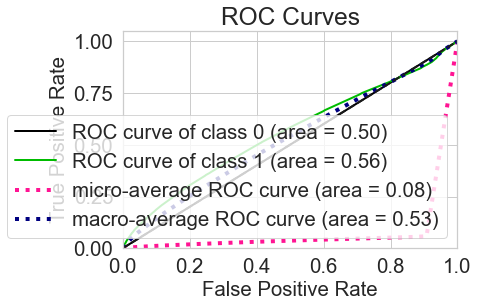

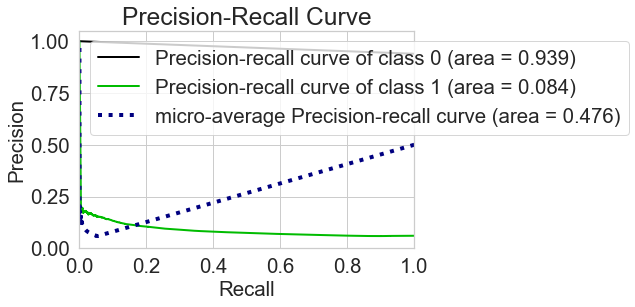

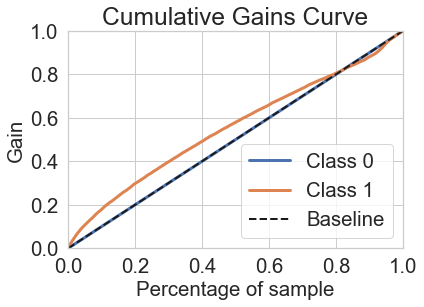

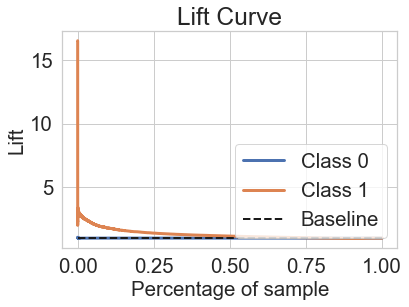

In [61]:
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Random Forest (Manual)
- Smote

In [62]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=100)
print(f"Estatistica de treinamento do target X: {Counter(y_train)}")
print(f"Estatistica de treinamento do target y: {Counter(y_test)}")

Estatistica de treinamento do target X: Counter({1: 525713, 0: 525688})
Estatistica de treinamento do target y: Counter({0: 225313, 1: 225288})


In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [65]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [66]:
y_pred = rfc.predict(X_test)

In [67]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369998
           1       0.18      0.01      0.02     23461

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.90      0.94      0.91    393459



In [68]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [69]:
print(confusion_matrix(y_test, y_pred))

[[369168    830]
 [ 23277    184]]


In [70]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9387305920057745


In [71]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.015035750766087843


In [72]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.95443967 0.04556033]
 [0.9373043  0.0626957 ]
 [0.95395591 0.04604409]
 ...
 [0.95968953 0.04031047]
 [0.95395591 0.04604409]
 [0.99055556 0.00944444]]


In [73]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [74]:
roc_auc0 = auc(fpr0, tpr0)

In [75]:
thresholds

array([1.99222222e+00, 9.92222222e-01, 9.90000000e-01, ...,
       9.09090909e-05, 3.34448161e-05, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [76]:
J = tpr0 - fpr0
print(J)



[ 0.          0.00012517  0.00012247 ... -0.00195183 -0.00195724
  0.        ]


In [77]:
ix = argmax(J)
print(ix)

6729


In [78]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.04556033]
 [0.         0.0626957 ]
 [0.         0.04604409]
 ...
 [0.         0.04031047]
 [0.         0.04604409]
 [0.         0.00944444]]


# Resultado Random Forest
 - Smote

In [79]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369998
           1       0.18      0.01      0.02     23461

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.90      0.94      0.91    393459

A matriz de confusão: [[369168    830]
 [ 23277    184]]
A acurácia do modelo: 0.9387305920057745
Valor do F1-score: 0.015035750766087843
Valor da sensibilidade: 0.007598656591099916
Valor da especificação: 0.9980169841385784


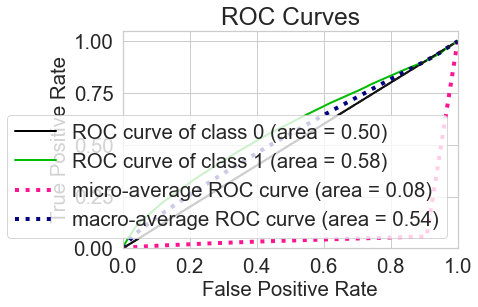

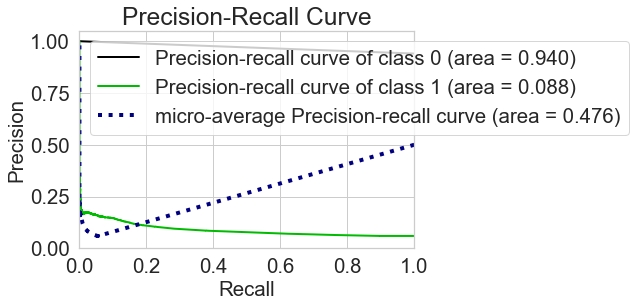

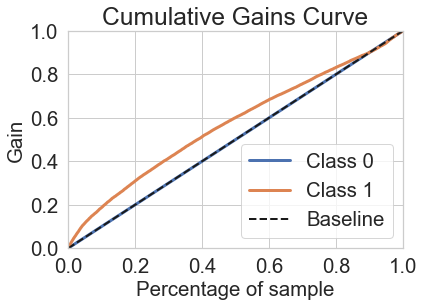

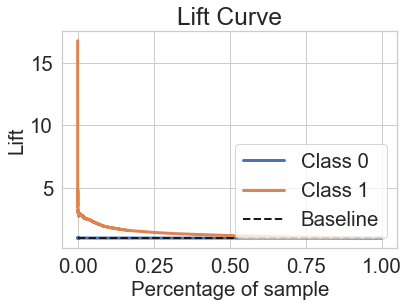

In [80]:
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# PCA

In [81]:
from sklearn.decomposition import PCA

In [82]:
pca = PCA(n_components=15)
pca_df = pca.fit_transform(scaled_X)
variancia = round(sum(pca.explained_variance_ratio_), 2)

In [83]:
y = df.result_igm
type(y)

pandas.core.series.Series

In [84]:
pca_df[:,:9].shape

(1192297, 9)

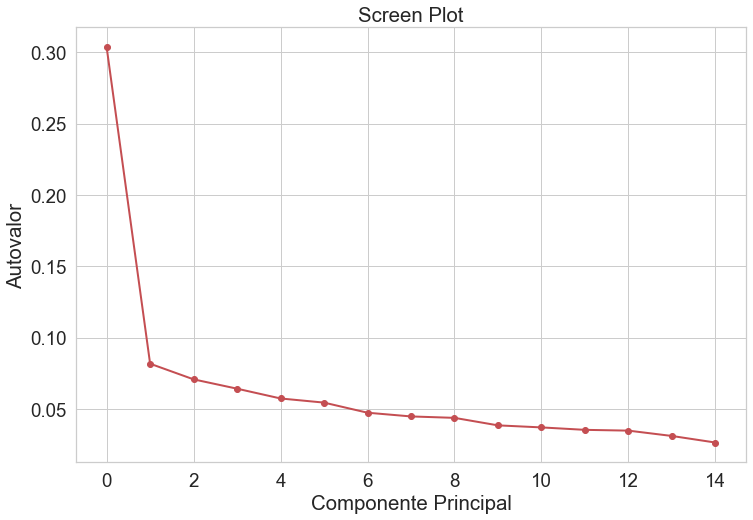

In [85]:
import numpy as np
fig = plt.figure(figsize=(12,8))

plt.plot(pca.explained_variance_ratio_,  'ro-', linewidth=2)
plt.title('Screen Plot')
plt.xlabel('Componente Principal')
plt.ylabel('Autovalor')

plt.show()

# Random Forest DEF ✅

In [86]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

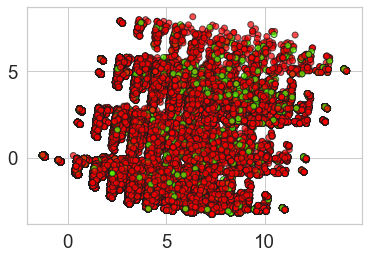

Resultado da prescisão 0.17594433399602386
Resultado do recall 0.007544435446059418
Resultado F1 0.014468467732047248
Resultado acurácia 0.9387153426405292
Sensibilidade:  0.007544435446059418
Especificação:  0.9977594473483641


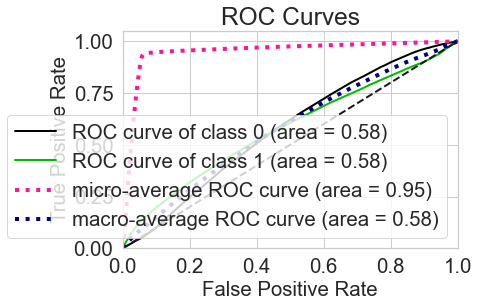

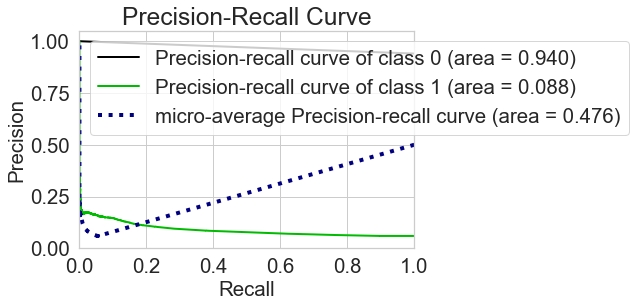

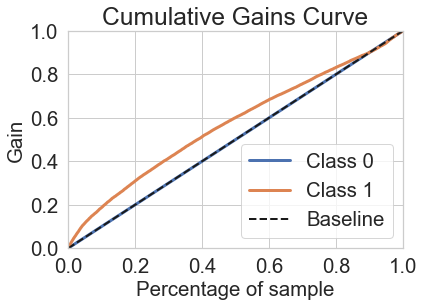

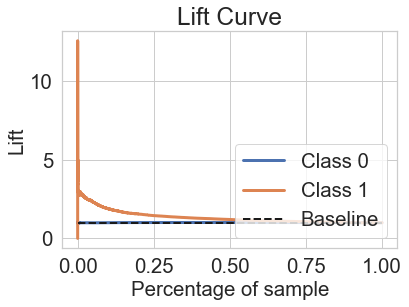

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369998
           1       0.18      0.01      0.01     23461

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.90      0.94      0.91    393459

[[369169    829]
 [ 23284    177]]


In [87]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- Oversample

In [88]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750642, 1: 750642})
Testing target statistics: Counter({0: 369998, 1: 23461})


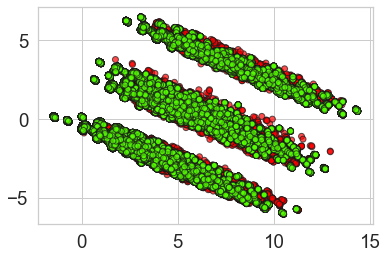

Resultado da prescisão 0.08232310675749589
Resultado do recall 0.35284088487276755
Resultado F1 0.13349890336730744
Resultado acurácia 0.7268838684589753
Sensibilidade:  0.35284088487276755
Especificação:  0.7506013546019168


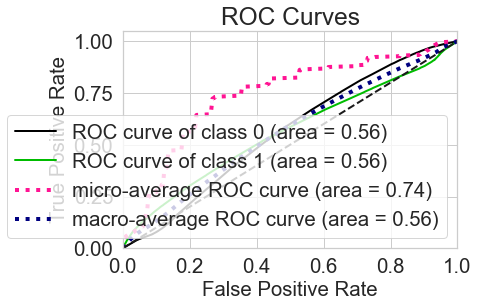

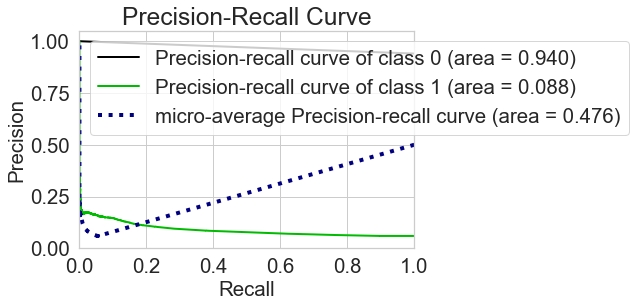

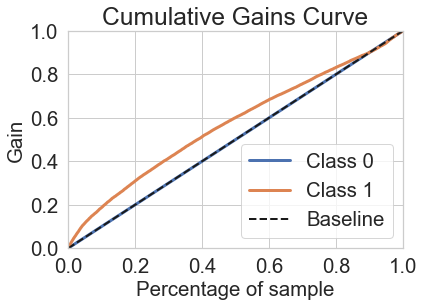

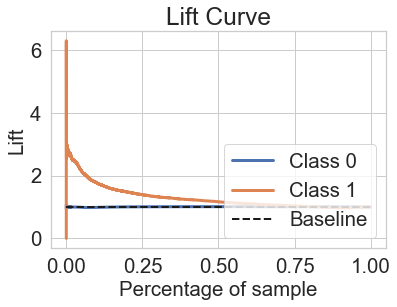

              precision    recall  f1-score   support

           0       0.95      0.75      0.84    369998
           1       0.08      0.35      0.13     23461

    accuracy                           0.73    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.73      0.80    393459

[[277721  92277]
 [ 15183   8278]]


In [89]:
roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

- SMOTE

In [90]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750642, 1: 750642})
Testing target statistics: Counter({0: 369998, 1: 23461})


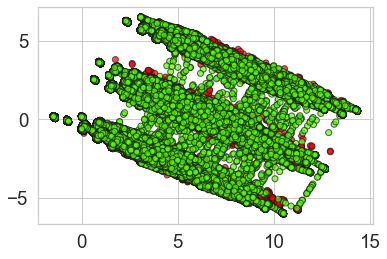

Resultado da prescisão 0.08166042871725077
Resultado do recall 0.31712203230893826
Resultado F1 0.12987693113380466
Resultado acurácia 0.7466317964514727
Sensibilidade:  0.31712203230893826
Especificação:  0.7738663452234877


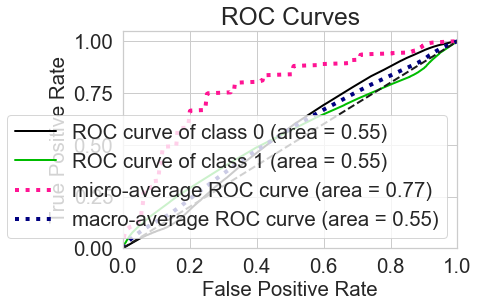

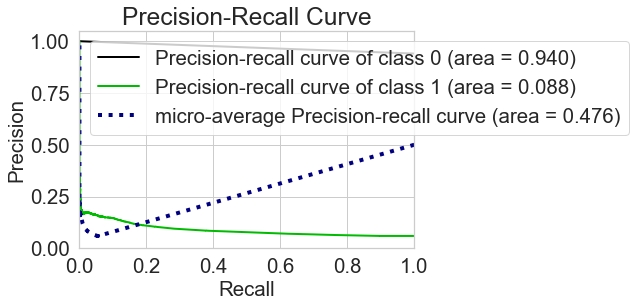

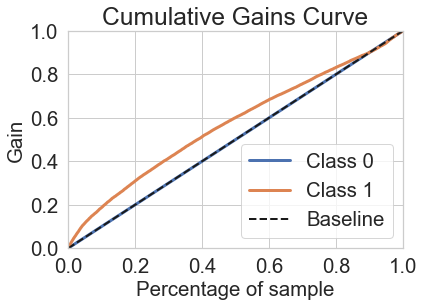

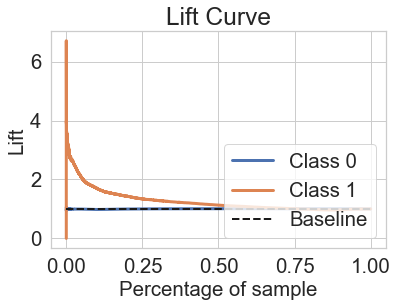

              precision    recall  f1-score   support

           0       0.95      0.77      0.85    369998
           1       0.08      0.32      0.13     23461

    accuracy                           0.75    393459
   macro avg       0.51      0.55      0.49    393459
weighted avg       0.90      0.75      0.81    393459

[[286329  83669]
 [ 16021   7440]]


In [91]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- UnderSampler

In [92]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48196, 1: 48196})
Testing target statistics: Counter({0: 369998, 1: 23461})


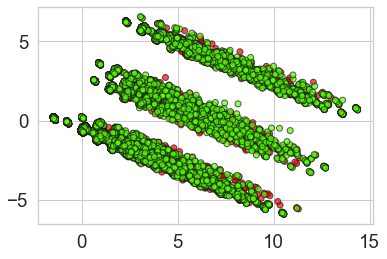

Resultado da prescisão 0.08504199657837498
Resultado do recall 0.42163590639785176
Resultado F1 0.14153670052940334
Resultado acurácia 0.6950228613400634
Sensibilidade:  0.42163590639785176
Especificação:  0.7123579046373224


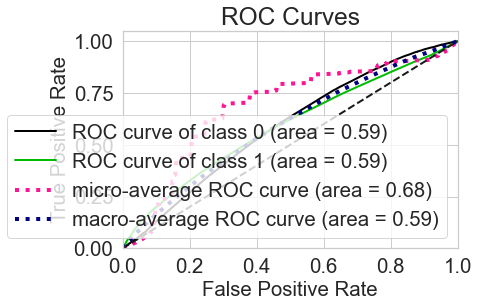

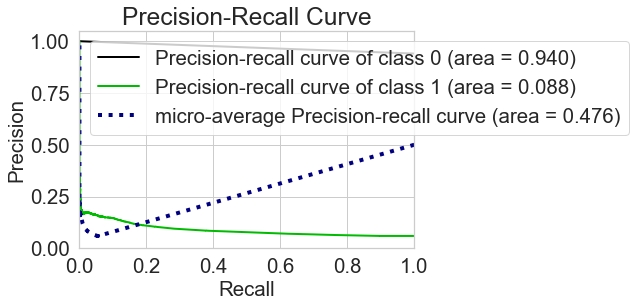

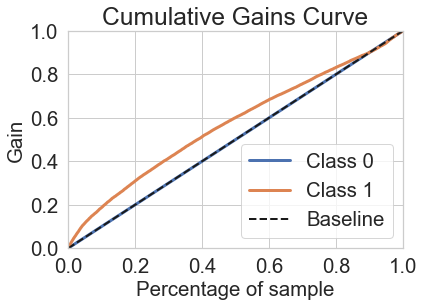

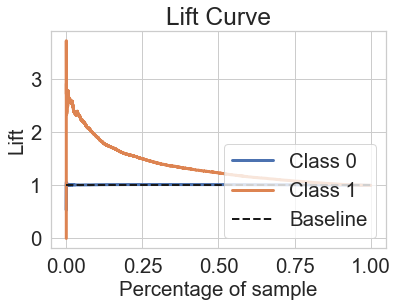

              precision    recall  f1-score   support

           0       0.95      0.71      0.81    369998
           1       0.09      0.42      0.14     23461

    accuracy                           0.70    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.70      0.77    393459

[[263571 106427]
 [ 13569   9892]]


In [93]:
roc_auc_rus1,fpr_rus1,tpr_rus1 , _ = build_and_test(X_res, X_test, y_res, y_test)

- NearMiss

In [94]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48196, 1: 48196})
Testing target statistics: Counter({0: 369998, 1: 23461})


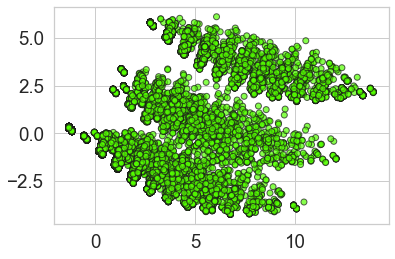

Resultado da prescisão 0.0637151746428104
Resultado do recall 0.5394484463577852
Resultado F1 0.11396924739413315
Resultado acurácia 0.49986402649323053
Sensibilidade:  0.5394484463577852
Especificação:  0.4973540397515662


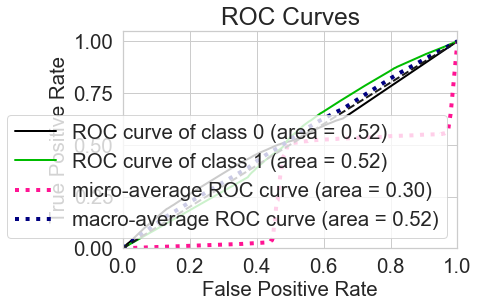

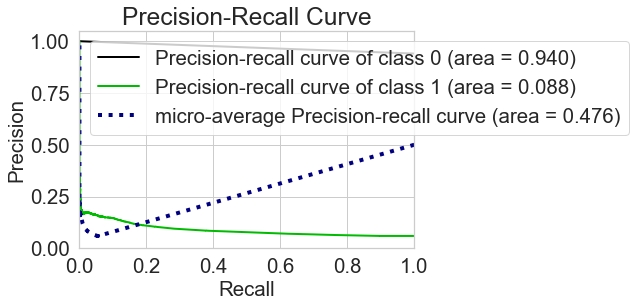

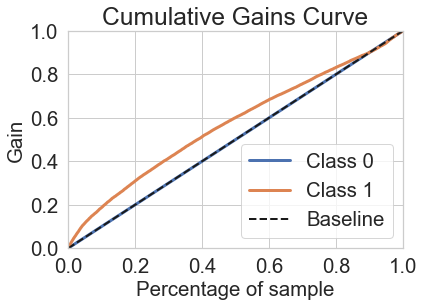

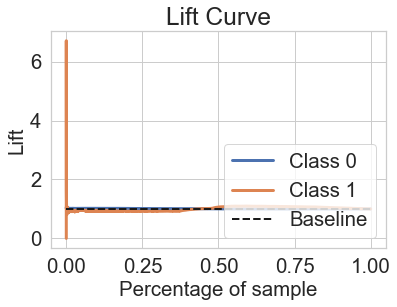

              precision    recall  f1-score   support

           0       0.94      0.50      0.65    369998
           1       0.06      0.54      0.11     23461

    accuracy                           0.50    393459
   macro avg       0.50      0.52      0.38    393459
weighted avg       0.89      0.50      0.62    393459

[[184020 185978]
 [ 10805  12656]]


In [95]:
roc_auc_nm1,fpr_nm1,tpr_nm1, _  = build_and_test(X_res, X_test, y_res, y_test)

- CW

In [96]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750642, 1: 48196}))

In [97]:
n[0]

750642

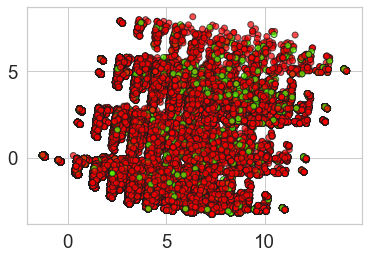

Resultado da prescisão 0.08338239462724319
Resultado do recall 0.3259878095562849
Resultado F1 0.13279737461257304
Resultado acurácia 0.7461311089592563
Sensibilidade:  0.3259878095562849
Especificação:  0.7727717447121336


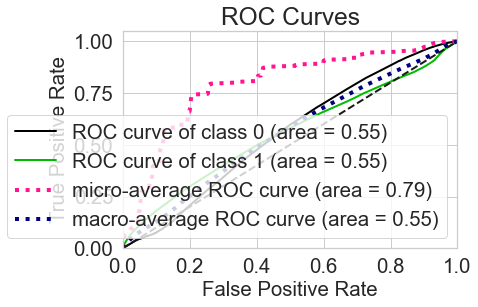

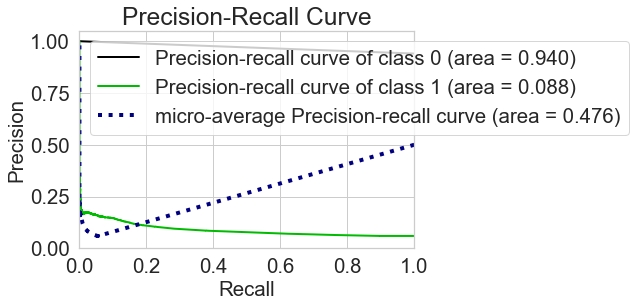

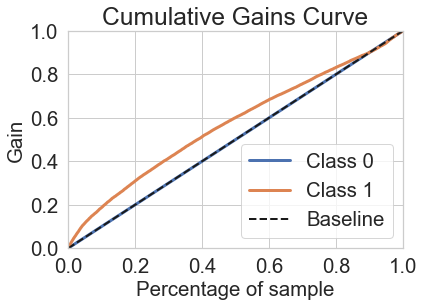

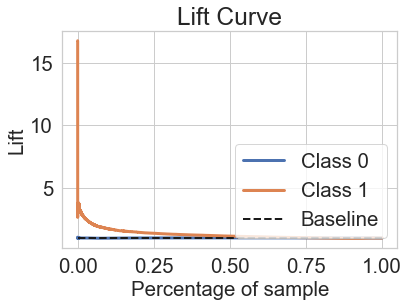

              precision    recall  f1-score   support

           0       0.95      0.77      0.85    369998
           1       0.08      0.33      0.13     23461

    accuracy                           0.75    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.75      0.81    393459

[[285924  84074]
 [ 15813   7648]]


In [98]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

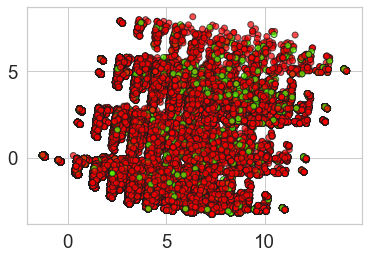

Resultado da prescisão 0.1757028112449799
Resultado do recall 0.007459187587911854
Resultado F1 0.014310831254855461
Resultado acurácia 0.9387305920057745
Sensibilidade:  0.007459187587911854
Especificação:  0.9977810690868599


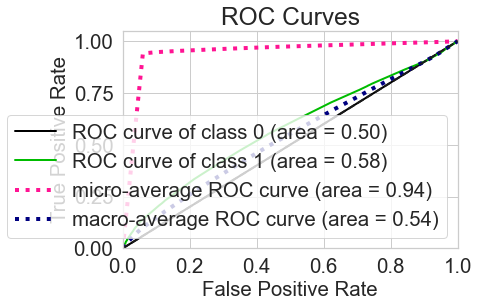

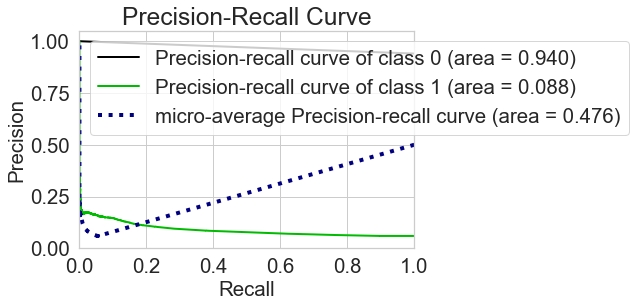

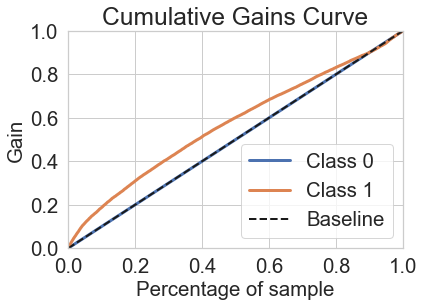

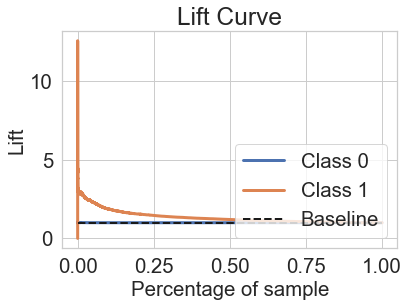

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369998
           1       0.18      0.01      0.01     23461

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.90      0.94      0.91    393459

[[369177    821]
 [ 23286    175]]
Best Treshold: 0.05877655677655677


In [99]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

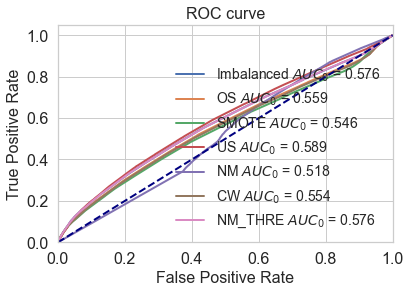

In [100]:
plt.plot(fpr_imb, tpr_imb, lw=2, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros, tpr_ros, lw=2, label='OS $AUC_0$ = %.3f' % (roc_auc_ros))
plt.plot(fpr_smote, tpr_smote, lw=2, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus1, tpr_rus1, lw=2, label='US $AUC_0$ = %.3f' % (roc_auc_rus1))
plt.plot(fpr_nm1, tpr_nm1, lw=2, label='NM $AUC_0$ = %.3f' % (roc_auc_nm1))
plt.plot(fpr_cw, tpr_cw, lw=2, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=2, label='NM_THRE $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# Regressão Logistíca (Manual)

In [101]:
from sklearn.linear_model import LogisticRegression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
print(f"Estatísticas do target y: {Counter(y_train)}")
print(f"Estatísticas do target X: {Counter(y_test)}")

Estatísticas do target y: Counter({0: 784451, 1: 50156})
Estatísticas do target X: Counter({0: 336189, 1: 21501})


- Vectorizer, pois é Logit ???? (ValueError: Cannot center sparse matrices: pass `with_mean=False` instead. See docstring for motivation and alternatives.)

In [102]:
#vectorizer = TfidfVectorizer(binary = True)
#matrix = vectorizer.fit_transform(df1)
#X = matrix


In [103]:
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [104]:
X = scaled_X

In [105]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [106]:
from sklearn.linear_model import LogisticRegression

In [107]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(sampling_strategy = 'minority', random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)


In [108]:
lgt = LogisticRegression()
lgt.fit(X_train, y_train)

LogisticRegression()

In [109]:
y_pred = lgt.predict(X_test)

In [110]:
print(classification_report(y_test, y_pred))

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369716
           1       0.00      0.00      0.00     23743

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459



C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [111]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [112]:
print(confusion_matrix(y_test, y_pred))

[[369716      0]
 [ 23743      0]]


In [113]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9396557201639815


In [114]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.0


In [115]:
y_score = lgt.predict_proba(X_test)
print(y_score)

[[0.94306068 0.05693932]
 [0.94232319 0.05767681]
 [0.94817878 0.05182122]
 ...
 [0.92393145 0.07606855]
 [0.96498999 0.03501001]
 [0.96095577 0.03904423]]


In [116]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [117]:
roc_auc0 = auc(fpr0, tpr0)

In [118]:
thresholds

array([1.37012195, 0.37012195, 0.35517018, ..., 0.01960132, 0.01944891,
       0.01743797])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [119]:
J = tpr0 - fpr0
print(J)



[ 0.00000000e+00 -2.70477880e-06 -1.08191152e-05 ... -2.85937828e-05
  1.35238940e-05  0.00000000e+00]


In [120]:
ix = argmax(J)
print(ix)

10739


In [121]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.05693932]
 [0.         0.05767681]
 [0.         0.05182122]
 ...
 [0.         0.07606855]
 [0.         0.03501001]
 [0.         0.03904423]]


# Resultado Regressão Logística

In [122]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )



C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369716
           1       0.00      0.00      0.00     23743

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

A matriz de confusão: [[369716      0]
 [ 23743      0]]
A acurácia do modelo: 0.9396557201639815
Valor do F1-score: 0.0


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


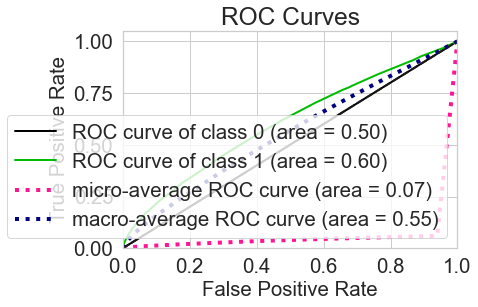

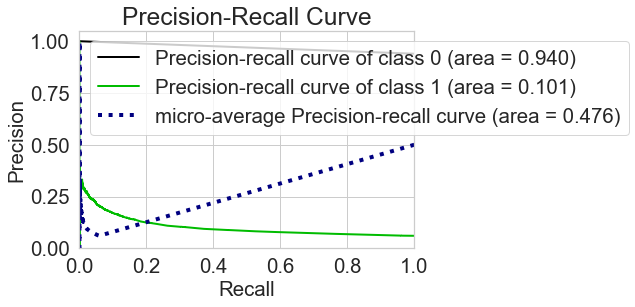

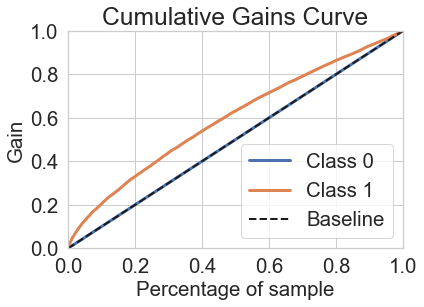

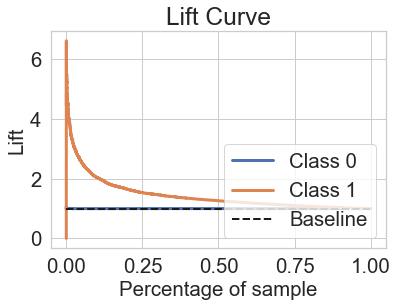

In [123]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Regressão Logística DEF ✅

In [124]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = LogisticRegression()
    else:
        model = LogisticRegression()
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

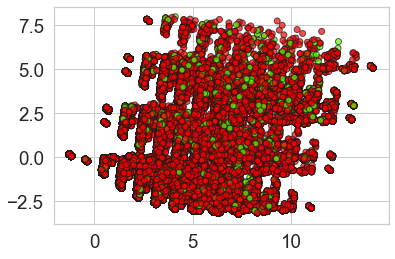

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9396557201639815
Sensibilidade:  0.0
Especificação:  1.0


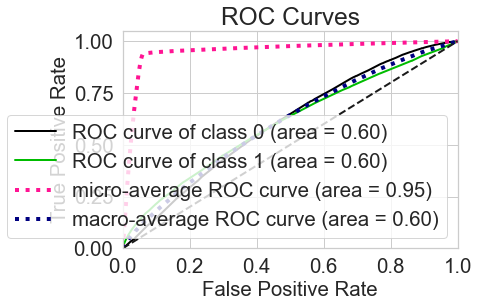

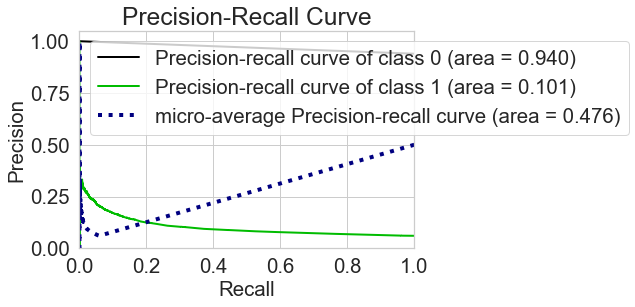

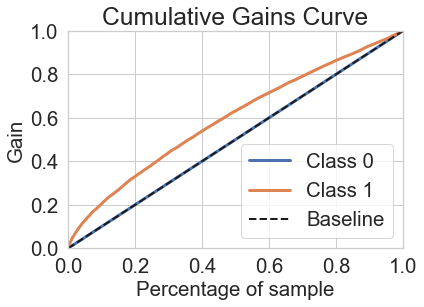

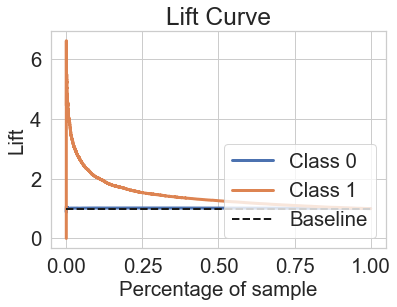

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369716
           1       0.00      0.00      0.00     23743

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369716      0]
 [ 23743      0]]


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [125]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- Oversample 🏆

In [126]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750924, 1: 750924})
Testing target statistics: Counter({0: 369716, 1: 23743})


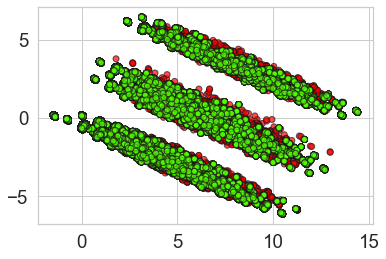

Resultado da prescisão 0.08754120834285341
Resultado do recall 0.4518384365918376
Resultado F1 0.14666657552412654
Resultado acurácia 0.6827242482698325
Sensibilidade:  0.4518384365918376
Especificação:  0.6975516342273529


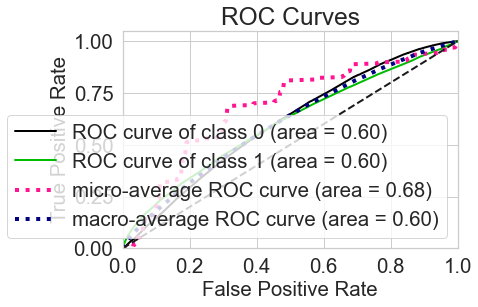

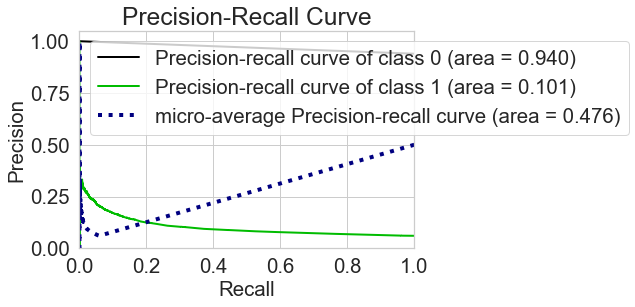

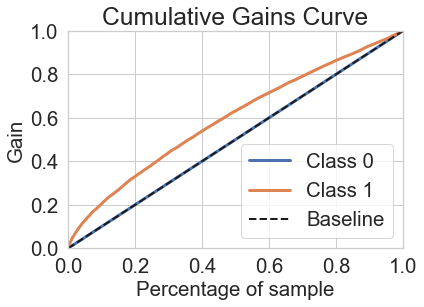

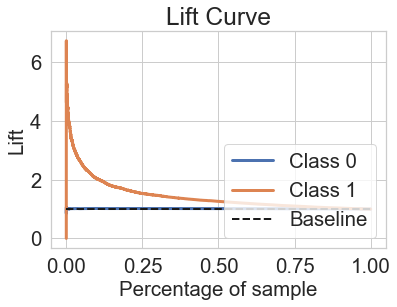

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369716
           1       0.09      0.45      0.15     23743

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.68      0.77    393459

[[257896 111820]
 [ 13015  10728]]


In [127]:
roc_auc_ros2,fpr_ros2,tpr_ros2, _ = build_and_test(X_res, X_test, y_res, y_test)

- SMOTE

In [128]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750924, 1: 750924})
Testing target statistics: Counter({0: 369716, 1: 23743})


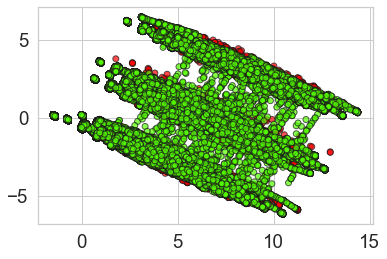

Resultado da prescisão 0.0875236418183004
Resultado do recall 0.45217537800614915
Resultado F1 0.14665965425150435
Resultado acurácia 0.682470092182413
Sensibilidade:  0.45217537800614915
Especificação:  0.6972595181166085


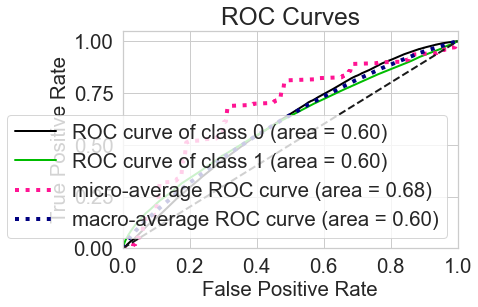

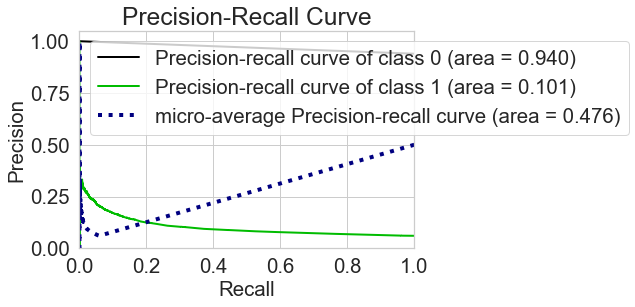

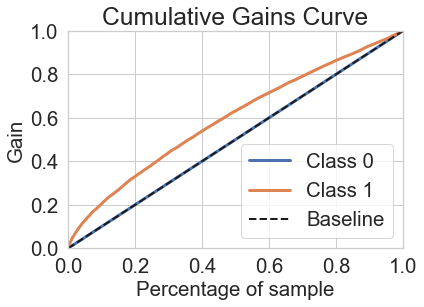

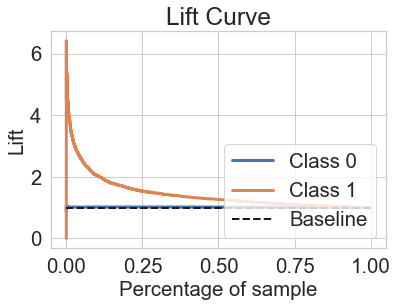

              precision    recall  f1-score   support

           0       0.95      0.70      0.80    369716
           1       0.09      0.45      0.15     23743

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.68      0.77    393459

[[257788 111928]
 [ 13007  10736]]


In [129]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- UnderSampler

In [130]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47914, 1: 47914})
Testing target statistics: Counter({0: 369716, 1: 23743})


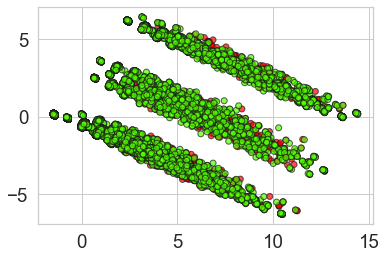

Resultado da prescisão 0.08791825087217214
Resultado do recall 0.4489744345701891
Resultado F1 0.14704259545354226
Resultado acurácia 0.6856800835665215
Sensibilidade:  0.4489744345701891
Especificação:  0.7008812169340791


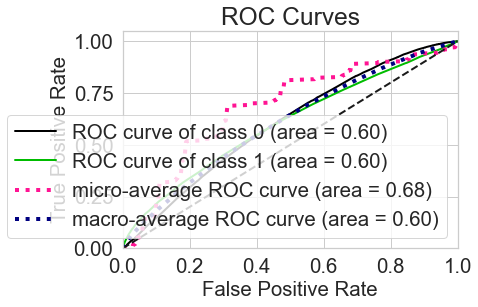

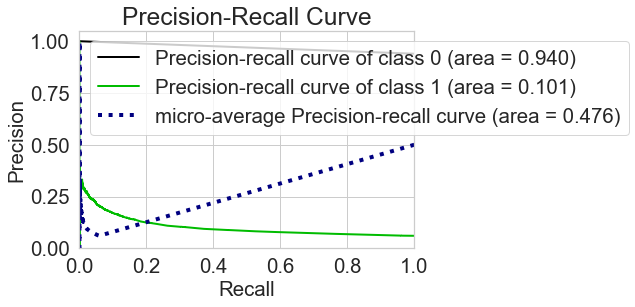

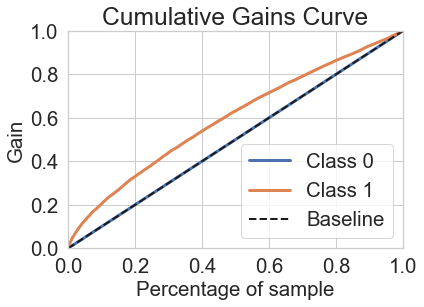

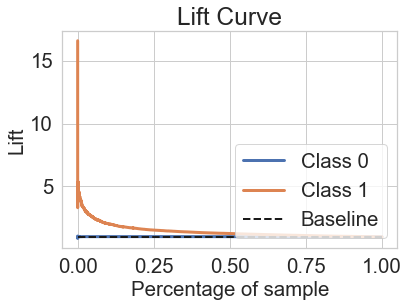

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369716
           1       0.09      0.45      0.15     23743

    accuracy                           0.69    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.69      0.77    393459

[[259127 110589]
 [ 13083  10660]]


In [131]:
roc_auc_rus,fpr_rus,tpr_rus , _ = build_and_test(X_res, X_test, y_res, y_test)

- NearMiss

In [132]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47914, 1: 47914})
Testing target statistics: Counter({0: 369716, 1: 23743})


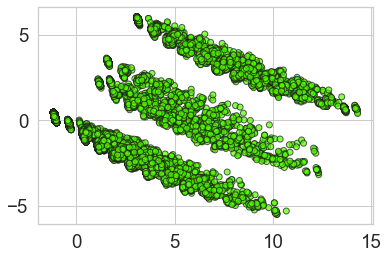

Resultado da prescisão 0.0811547356023418
Resultado do recall 0.39759086888767214
Resultado F1 0.13479552204706421
Resultado acurácia 0.6920034870215194
Sensibilidade:  0.39759086888767214
Especificação:  0.7109105367363057


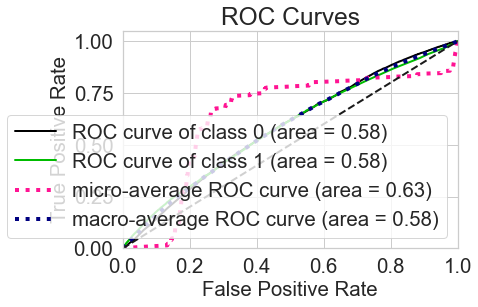

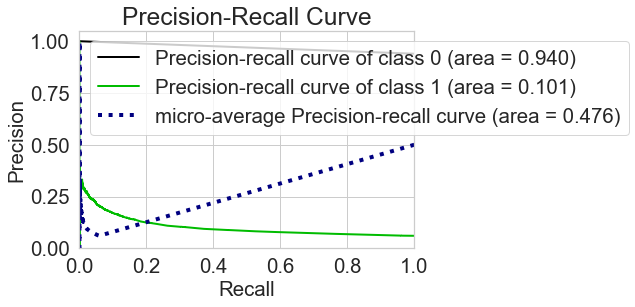

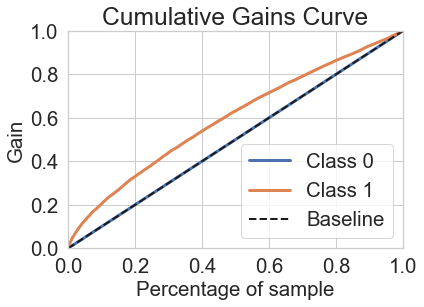

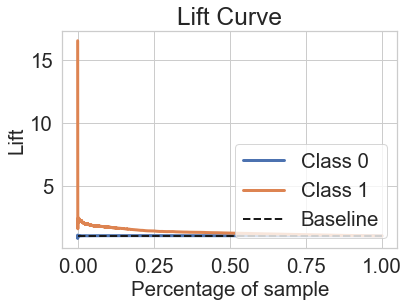

              precision    recall  f1-score   support

           0       0.95      0.71      0.81    369716
           1       0.08      0.40      0.13     23743

    accuracy                           0.69    393459
   macro avg       0.51      0.55      0.47    393459
weighted avg       0.90      0.69      0.77    393459

[[262835 106881]
 [ 14303   9440]]


In [133]:
roc_auc_nm,fpr_nm,tpr_nm, _  = build_and_test(X_res, X_test, y_res, y_test)

- Class Weight

In [134]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750924, 1: 47914}))

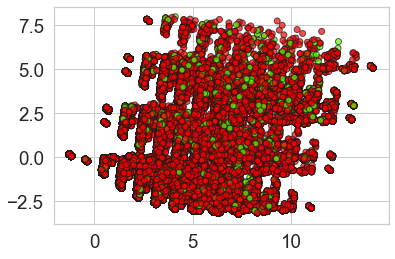

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9396557201639815
Sensibilidade:  0.0
Especificação:  1.0


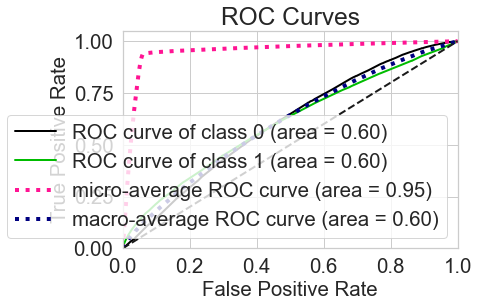

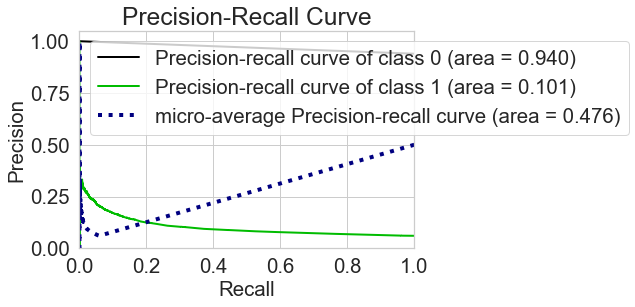

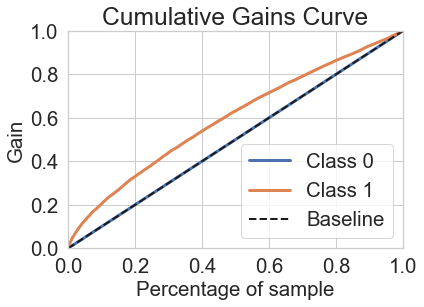

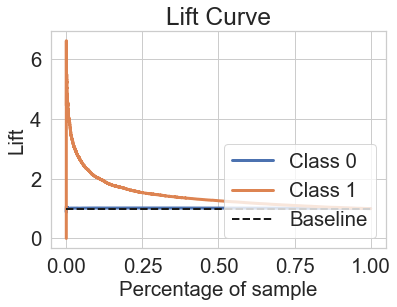

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369716
           1       0.00      0.00      0.00     23743

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369716      0]
 [ 23743      0]]


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [135]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

- Threshold

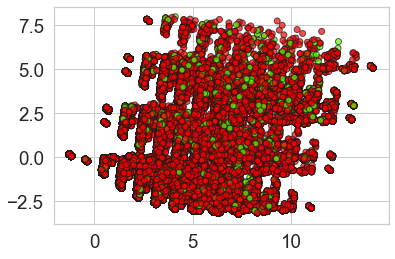

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9396557201639815
Sensibilidade:  0.0
Especificação:  1.0


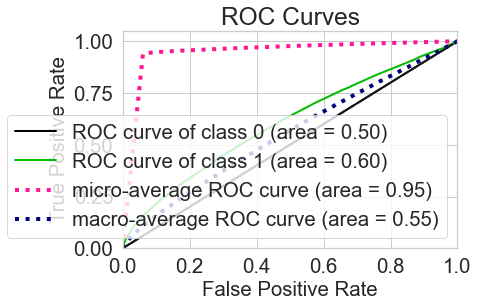

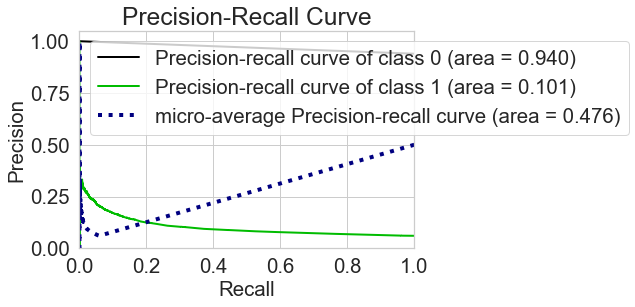

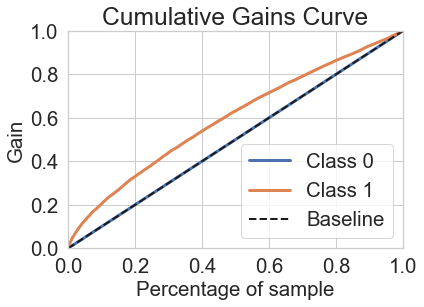

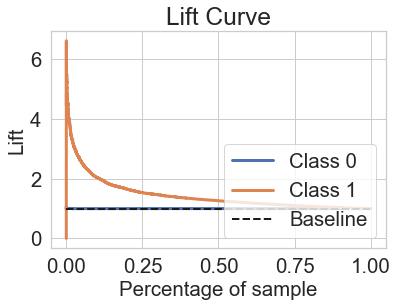

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369716
           1       0.00      0.00      0.00     23743

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369716      0]
 [ 23743      0]]
Best Treshold: 0.061564615772904514


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [136]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

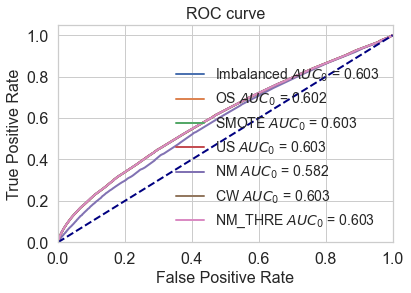

In [137]:
plt.plot(fpr_imb, tpr_imb, lw=2, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros2, tpr_ros2, lw=2, label='OS $AUC_0$ = %.3f' % (roc_auc_ros2))
plt.plot(fpr_smote, tpr_smote, lw=2, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus, tpr_rus, lw=2, label='US $AUC_0$ = %.3f' % (roc_auc_rus))
plt.plot(fpr_nm, tpr_nm, lw=2, label='NM $AUC_0$ = %.3f' % (roc_auc_nm))
plt.plot(fpr_cw, tpr_cw, lw=2, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=2, label='NM_THRE $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# Decision Tree (Manual)

In [138]:
from sklearn.tree import DecisionTreeClassifier

In [139]:
X = df1

In [140]:
y = df['result_igm']

In [141]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [142]:
X = scaled_X

In [143]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [144]:
from sklearn.tree import DecisionTreeClassifier
d_t = DecisionTreeClassifier()
d_t.fit(X_train, y_train)

DecisionTreeClassifier()

In [145]:
y_pred = d_t.predict(X_test)

In [146]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369629
           1       0.16      0.01      0.02     23830

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [147]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [148]:
print(confusion_matrix(y_test, y_pred))

[[368251   1378]
 [ 23567    263]]


In [149]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9366007639931988


In [150]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.020650936358996504


In [151]:
y_score = d_t.predict_proba(X_test)
print(y_score)

[[0.93689679 0.06310321]
 [0.95026785 0.04973215]
 [0.94205346 0.05794654]
 ...
 [0.93883357 0.06116643]
 [0.94906518 0.05093482]
 [0.89130435 0.10869565]]


In [152]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [153]:
roc_auc0 = auc(fpr0, tpr0)

In [154]:
thresholds

array([2.        , 1.        , 0.85714286, 0.8       , 0.75      ,
       0.71428571, 0.66666667, 0.625     , 0.6       , 0.57142857,
       0.55555556, 0.5       , 0.46666667, 0.46153846, 0.45454545,
       0.44444444, 0.42857143, 0.41666667, 0.41176471, 0.4       ,
       0.38461538, 0.375     , 0.36363636, 0.35820896, 0.35714286,
       0.35294118, 0.34615385, 0.33333333, 0.32352941, 0.31818182,
       0.3125    , 0.30769231, 0.3       , 0.29411765, 0.28571429,
       0.2826087 , 0.28      , 0.27777778, 0.27586207, 0.27272727,
       0.26829268, 0.26666667, 0.265625  , 0.26315789, 0.26229508,
       0.26190476, 0.25806452, 0.25714286, 0.25      , 0.24475524,
       0.24      , 0.23913043, 0.23809524, 0.23529412, 0.23300971,
       0.23076923, 0.22857143, 0.22727273, 0.22580645, 0.225     ,
       0.22297297, 0.22222222, 0.22119816, 0.2195122 , 0.21904762,
       0.21875   , 0.2173913 , 0.21621622, 0.21428571, 0.21212121,
       0.21138211, 0.21052632, 0.20987654, 0.20833333, 0.20610

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [155]:
J = tpr0 - fpr0
print(J)



[ 0.          0.00604917  0.00603564  0.00610063  0.00613857  0.00617512
  0.00715406  0.00714053  0.00723263  0.00727189  0.00730845  0.01079487
  0.01082601  0.01085986  0.01084363  0.01086395  0.0112201   0.01135958
  0.01136637  0.01220607  0.01238343  0.01266244  0.01292649  0.01330284
  0.01335701  0.01333266  0.01342338  0.01744554  0.01753085  0.01759584
  0.01762428  0.01795193  0.01833785  0.01846512  0.01969331  0.01975698
  0.01978542  0.01993434  0.020044    0.0203785   0.02037718  0.02058165
  0.02076309  0.02101085  0.02121934  0.02151447  0.02160249  0.02172977
  0.02511146  0.02683914  0.02705581  0.02709645  0.02754729  0.02754741
  0.02788048  0.02789412  0.02788877  0.02803775  0.0280811   0.02821919
  0.02854823  0.02945148  0.02981178  0.02988085  0.0299432   0.02998925
  0.03000554  0.0299934   0.03013167  0.03014797  0.03041202  0.03053803
  0.03063284  0.03071003  0.03096193  0.03124083  0.03359934  0.03370227
  0.03383231  0.03400569  0.03452838  0.03454467  0

In [156]:
ix = argmax(J)
print(ix)

380


In [157]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.06310321]
 [0.         0.04973215]
 [0.         0.05794654]
 ...
 [0.         0.06116643]
 [0.         0.05093482]
 [0.         0.10869565]]


# Resultado Decision Tree 

In [158]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )



A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369629
           1       0.16      0.01      0.02     23830

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[368251   1378]
 [ 23567    263]]
A acurácia do modelo: 0.9366007639931988
Valor do F1-score: 0.020650936358996504


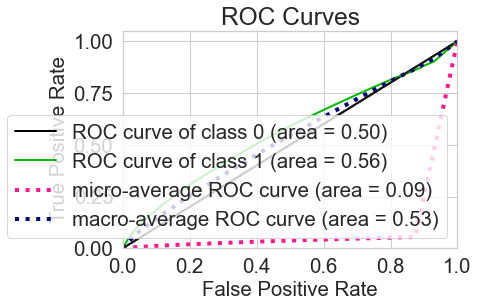

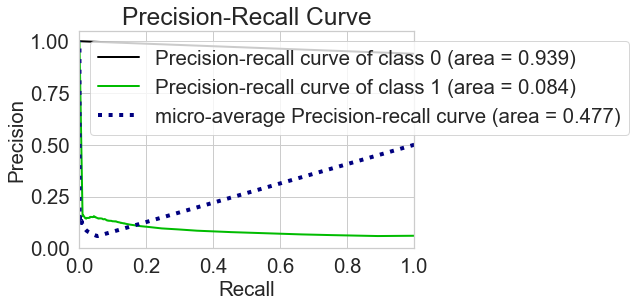

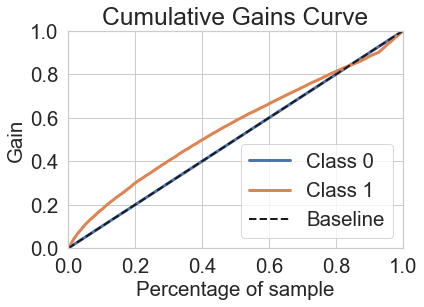

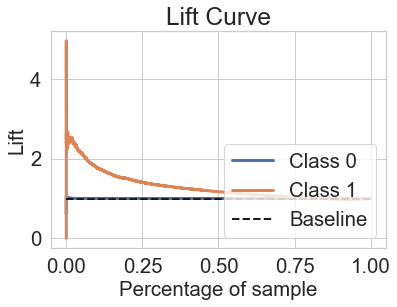

In [159]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Decision Tree DEF ✅

In [160]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report

from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # construindo modelo
    if class_weight:
        model = DecisionTreeClassifier(class_weight=class_weight)
    else:
        model = DecisionTreeClassifier()
    model.fit(X_tr, y_tr)
    
    # modelo
    y_pred = model.predict(X_te)
    print('Precision score %s' % precision_score(y_te, y_pred))
    print('Recall score %s' % recall_score(y_te, y_pred))
    print('F1-score score %s' % f1_score(y_te, y_pred))
    print('Accuracy score %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # Calculate the best threshold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valores que maximizam a estatística J
        best_threshold = thresholds[ix]
        # ajuste de score de acordo com threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    
    # Plot
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_te,y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

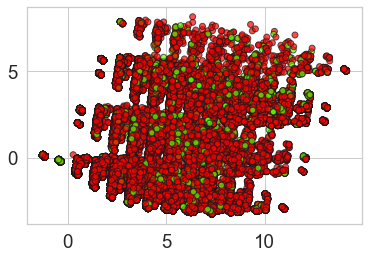

Precision score 0.16039481801357186
Recall score 0.010910616869492237
F1-score score 0.02043141723311461
Accuracy score 0.9366363458454375
Sensibilidade:  0.010910616869492237
Especificação:  0.9963179295996797


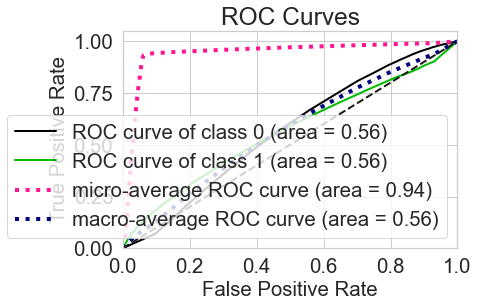

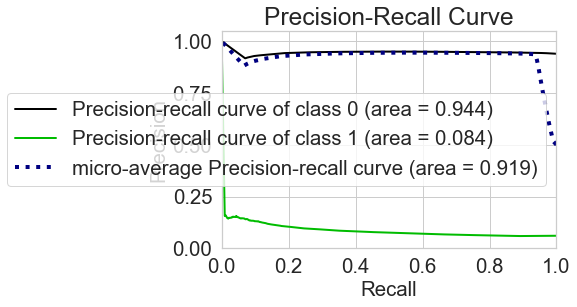

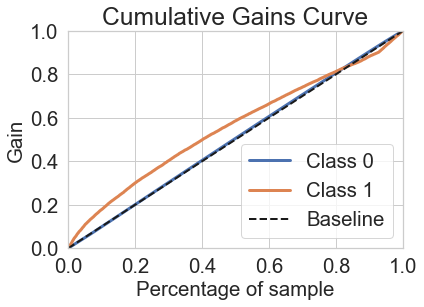

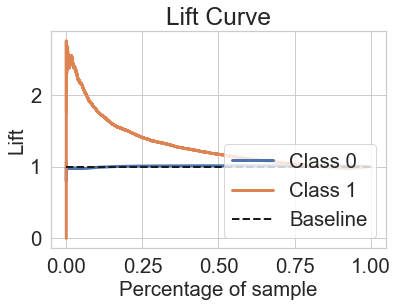

[[368268   1361]
 [ 23570    260]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369629
           1       0.16      0.01      0.02     23830

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [161]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- OverSample

In [162]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 751011, 1: 751011})
Testing target statistics: Counter({0: 369629, 1: 23830})


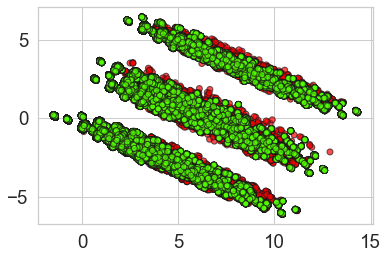

Precision score 0.08414594061575545
Recall score 0.3545111204364247
F1-score score 0.13600908015165786
Accuracy score 0.7272117298117465
Sensibilidade:  0.3545111204364247
Especificação:  0.7512397566208279


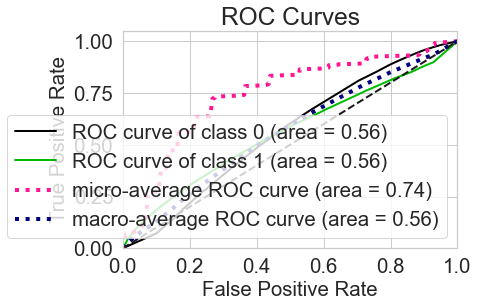

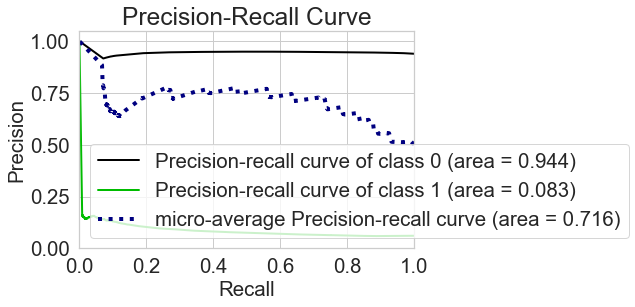

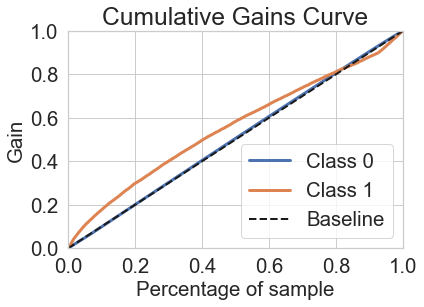

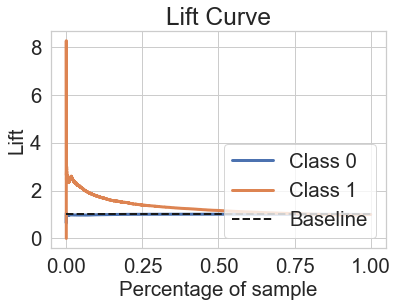

[[277680  91949]
 [ 15382   8448]]
              precision    recall  f1-score   support

           0       0.95      0.75      0.84    369629
           1       0.08      0.35      0.14     23830

    accuracy                           0.73    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.73      0.80    393459



In [163]:
roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

- Smote

In [164]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 751011, 1: 751011})
Testing target statistics: Counter({0: 369629, 1: 23830})


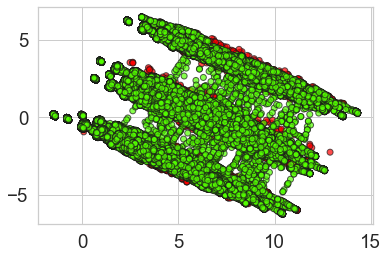

Precision score 0.08386998021057696
Recall score 0.3219051615610575
F1-score score 0.1330696573079025
Accuracy score 0.7459684490633077
Sensibilidade:  0.3219051615610575
Especificação:  0.7733078302838793


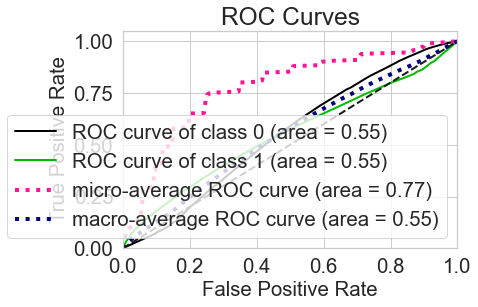

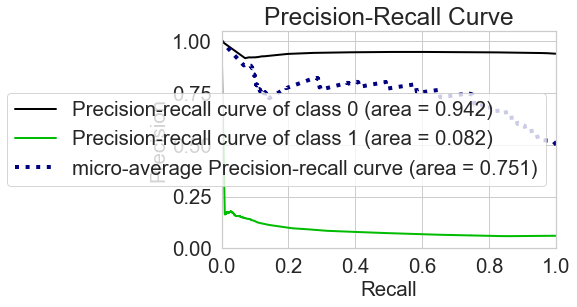

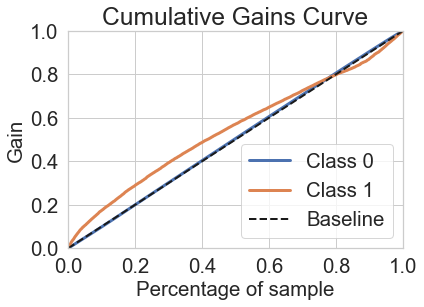

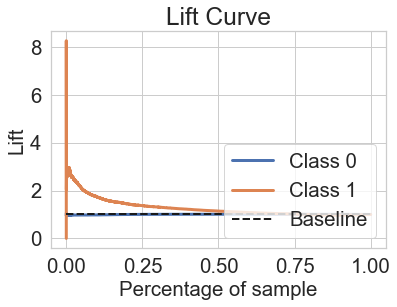

[[285837  83792]
 [ 16159   7671]]
              precision    recall  f1-score   support

           0       0.95      0.77      0.85    369629
           1       0.08      0.32      0.13     23830

    accuracy                           0.75    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.89      0.75      0.81    393459



In [165]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- Undersample

In [166]:
from imblearn.under_sampling import RandomUnderSampler

under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47827, 1: 47827})
Testing target statistics: Counter({0: 369629, 1: 23830})


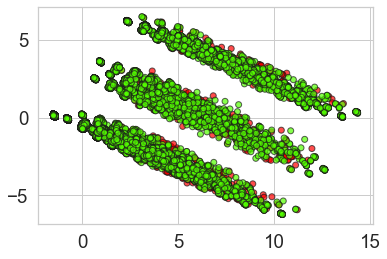

Precision score 0.08513253233055122
Recall score 0.38950902224087286
F1-score score 0.13972602739726026
Accuracy score 0.7095097583229765
Sensibilidade:  0.38950902224087286
Especificação:  0.7301402216817403


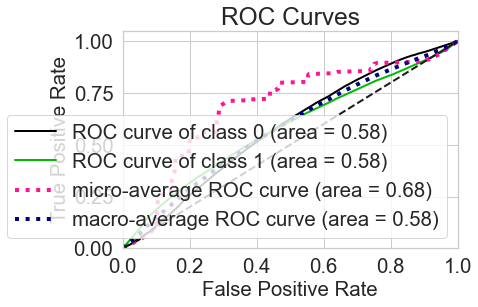

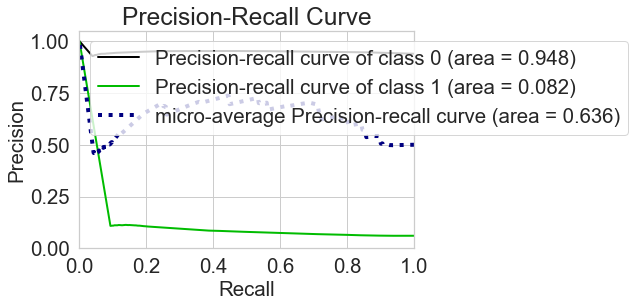

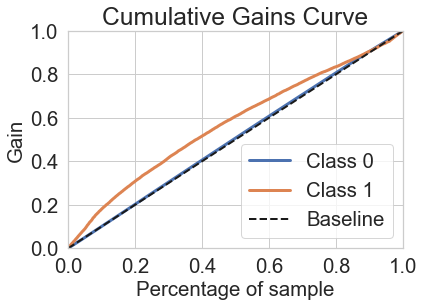

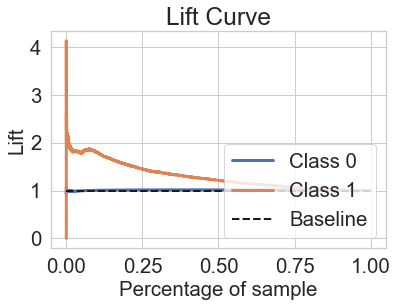

[[269881  99748]
 [ 14548   9282]]
              precision    recall  f1-score   support

           0       0.95      0.73      0.83    369629
           1       0.09      0.39      0.14     23830

    accuracy                           0.71    393459
   macro avg       0.52      0.56      0.48    393459
weighted avg       0.90      0.71      0.78    393459



In [167]:
roc_auc_rus3,fpr_rus3,tpr_rus3 , _ = build_and_test(X_res, X_test, y_res, y_test)

- Near Miss Under Sampler

In [168]:
from imblearn.under_sampling import NearMiss

under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47827, 1: 47827})
Testing target statistics: Counter({0: 369629, 1: 23830})


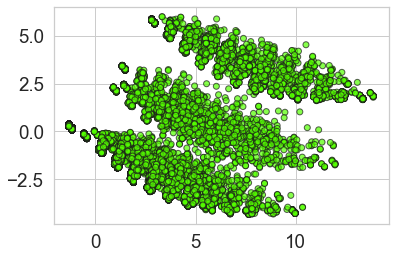

Precision score 0.06439704467108981
Recall score 0.5307175828787243
F1-score score 0.1148573478460274
Accuracy score 0.504581163475737
Sensibilidade:  0.5307175828787243
Especificação:  0.502896147217886


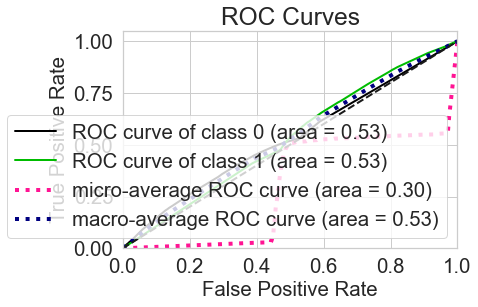

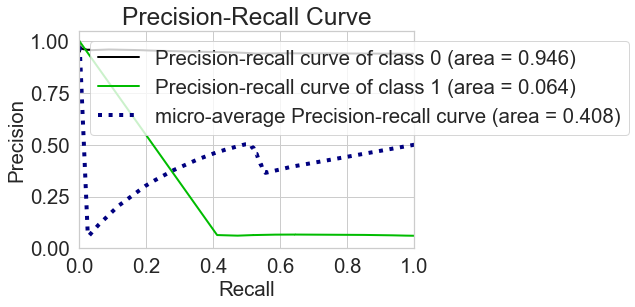

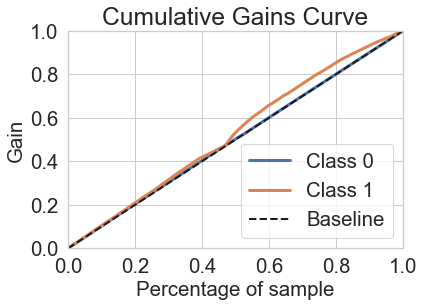

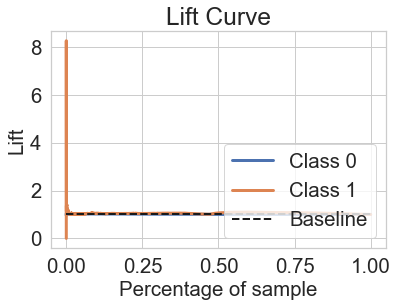

[[185885 183744]
 [ 11183  12647]]
              precision    recall  f1-score   support

           0       0.94      0.50      0.66    369629
           1       0.06      0.53      0.11     23830

    accuracy                           0.50    393459
   macro avg       0.50      0.52      0.39    393459
weighted avg       0.89      0.50      0.62    393459



In [169]:
roc_auc_nm,fpr_nm,tpr_nm, _  = build_and_test(X_res, X_test, y_res, y_test)

- Class Weight

In [170]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 751011, 1: 47827}))

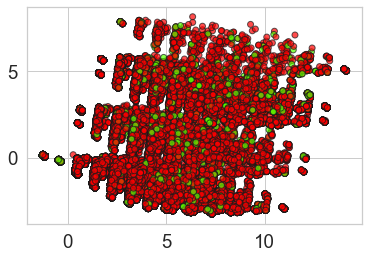

Precision score 0.0848688963278762
Recall score 0.35002098195551823
F1-score score 0.13661340911138228
Accuracy score 0.732045778594466
Sensibilidade:  0.35002098195551823
Especificação:  0.7566749362198313


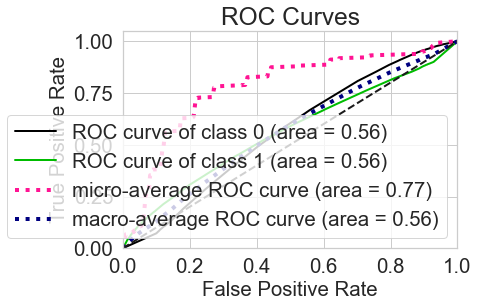

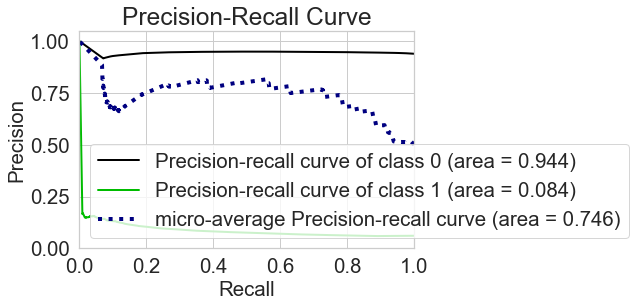

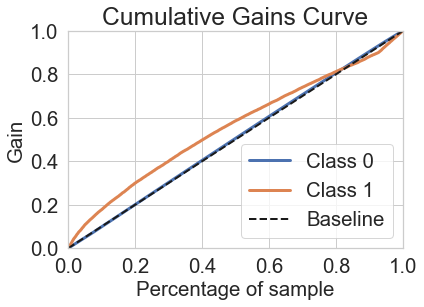

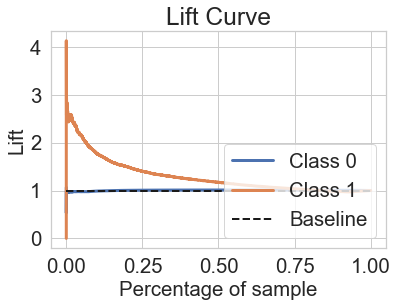

[[279689  89940]
 [ 15489   8341]]
              precision    recall  f1-score   support

           0       0.95      0.76      0.84    369629
           1       0.08      0.35      0.14     23830

    accuracy                           0.73    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.73      0.80    393459



In [171]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

- Threshold

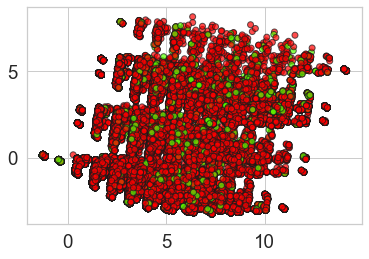

Precision score 0.15962732919254657
Recall score 0.010784725136382711
F1-score score 0.02020440251572327
Accuracy score 0.9366490536498084
Sensibilidade:  0.010784725136382711
Especificação:  0.9963395729231203


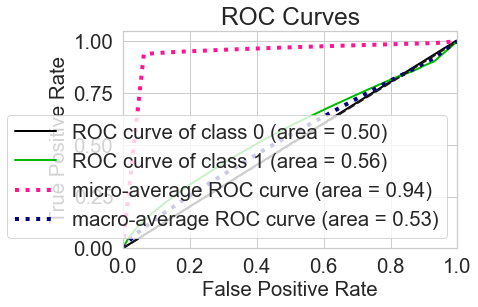

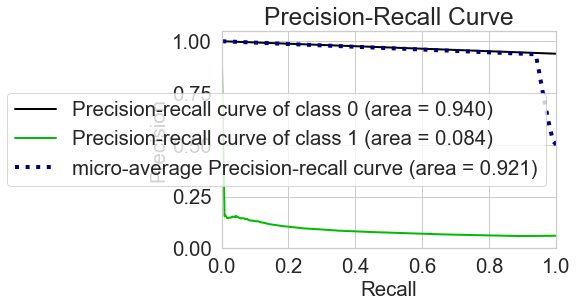

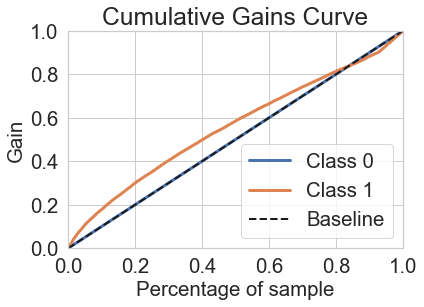

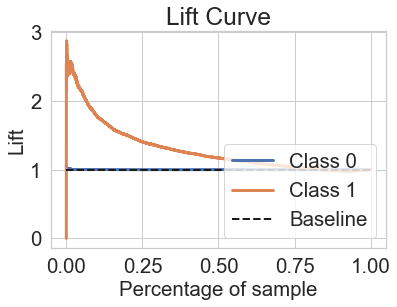

[[368276   1353]
 [ 23573    257]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369629
           1       0.16      0.01      0.02     23830

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

Best Treshold: 0.05794654404368444


In [172]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

- Plot

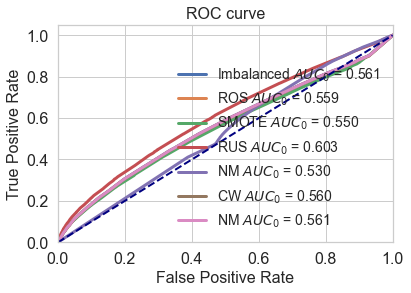

In [173]:
plt.plot(fpr_imb, tpr_imb, lw=3, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros, tpr_ros, lw=3, label='ROS $AUC_0$ = %.3f' % (roc_auc_ros))
plt.plot(fpr_smote, tpr_smote, lw=3, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus, tpr_rus, lw=3, label='RUS $AUC_0$ = %.3f' % (roc_auc_rus))
plt.plot(fpr_nm, tpr_nm, lw=3, label='NM $AUC_0$ = %.3f' % (roc_auc_nm))
plt.plot(fpr_cw, tpr_cw, lw=3, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=3, label='NM $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# RANDOM FOREST US Ajustes 🔱

In [174]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [175]:
import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy'),
    if warm_start:
        model = RandomForestClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    features1 =  model.feature_importances_

    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    feats = {}
    for feature, importance in zip(df1.columns, features1):
        feats[feature] = importance
        importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
        importances = importances.sort_values(by='Gini-Importance', ascending=False)
        importances = importances.reset_index()
        importances = importances.rename(columns={'index': 'Features'})
        sns.set(font_scale = 5)
        sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
        fig, ax = plt.subplots()
        fig.set_size_inches(30,15)
        sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
        plt.xlabel('Importance', fontsize=25, weight = 'bold')
        plt.ylabel('Features', fontsize=25, weight = 'bold')
        plt.title('Feature Importance', fontsize=25, weight = 'bold')
        display(plt.show())
        display(importances)
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [176]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47783, 1: 47783})
Testing target statistics: Counter({0: 369585, 1: 23874})


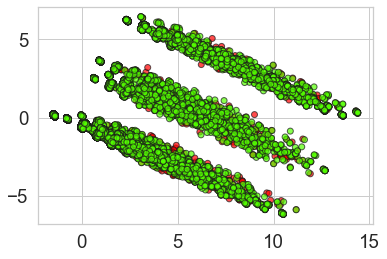

Resultado da prescisão 0.0863089005235602
Resultado do recall 0.4143000753958281
Resultado F1 0.14285714285714285
Resultado acurácia 0.698337056720014
Sensibilidade:  0.4143000753958281
Especificação:  0.7166849303949024


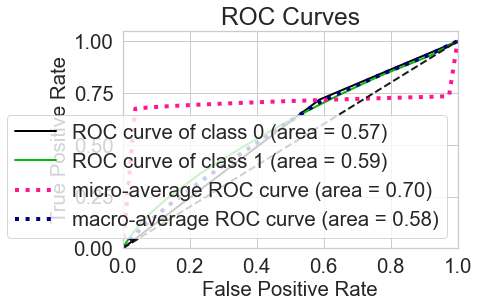

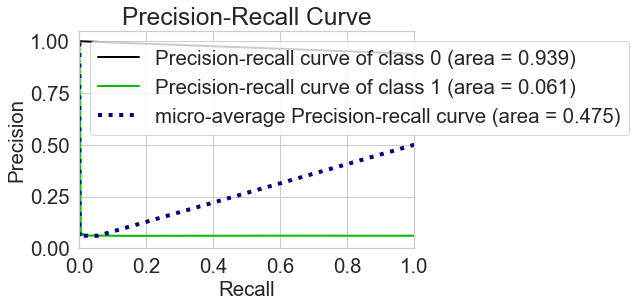

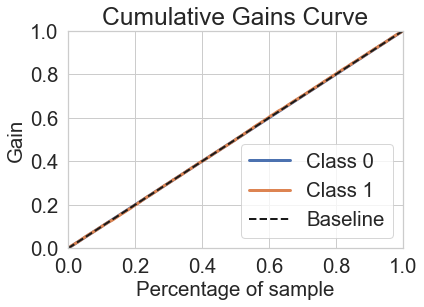

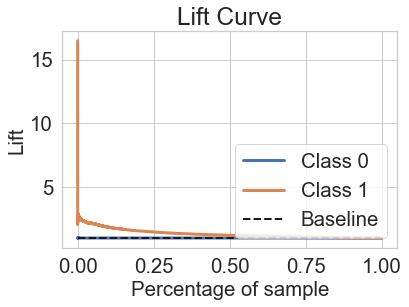

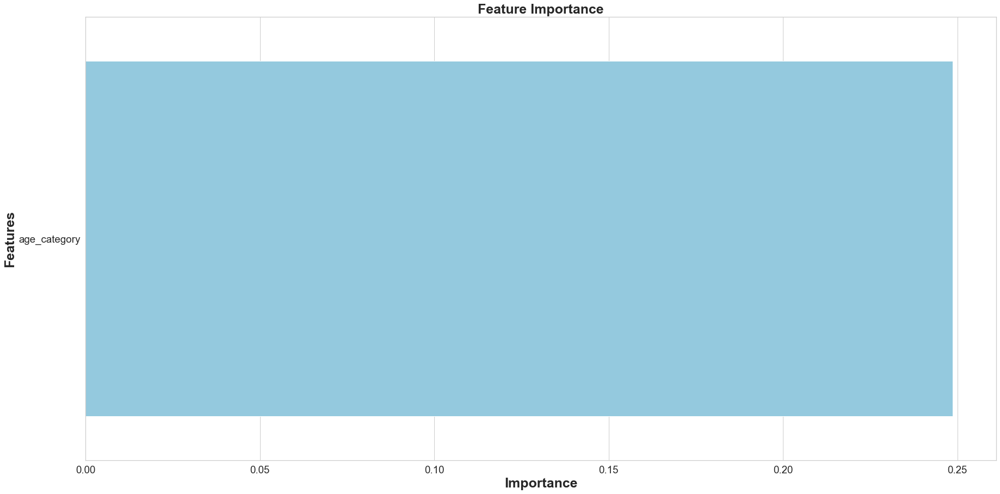

None

,Features,Gini-Importance
0,age_category,0.248689


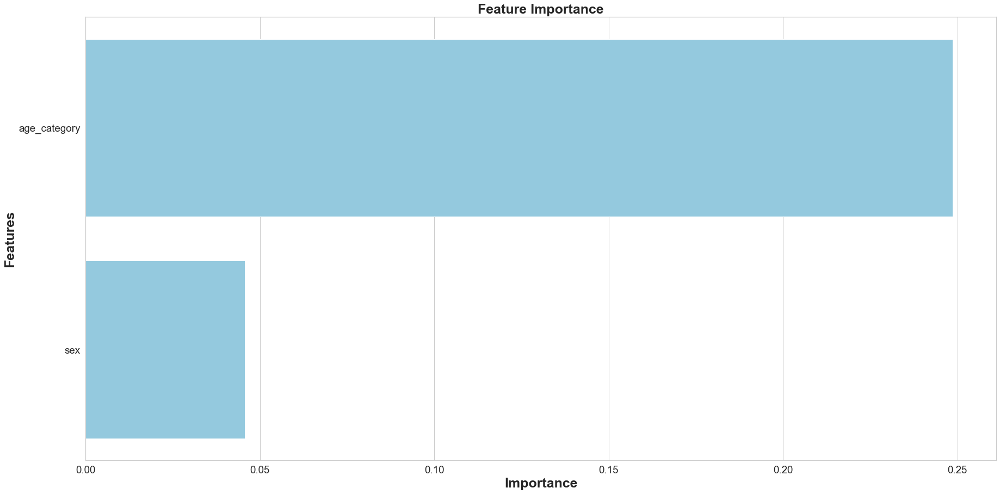

None

,Features,Gini-Importance
0,age_category,0.248689
1,sex,0.045632


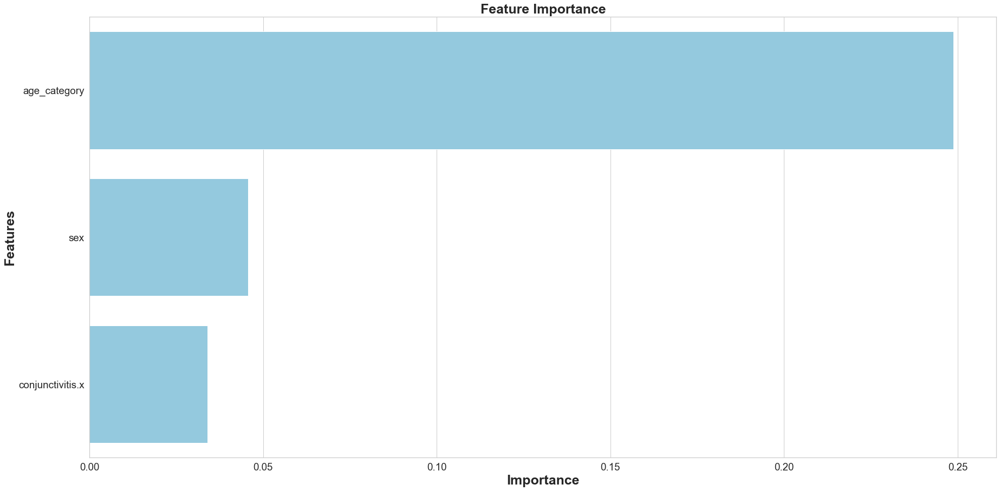

None

,Features,Gini-Importance
0,age_category,0.248689
1,sex,0.045632
2,conjunctivitis.x,0.033978


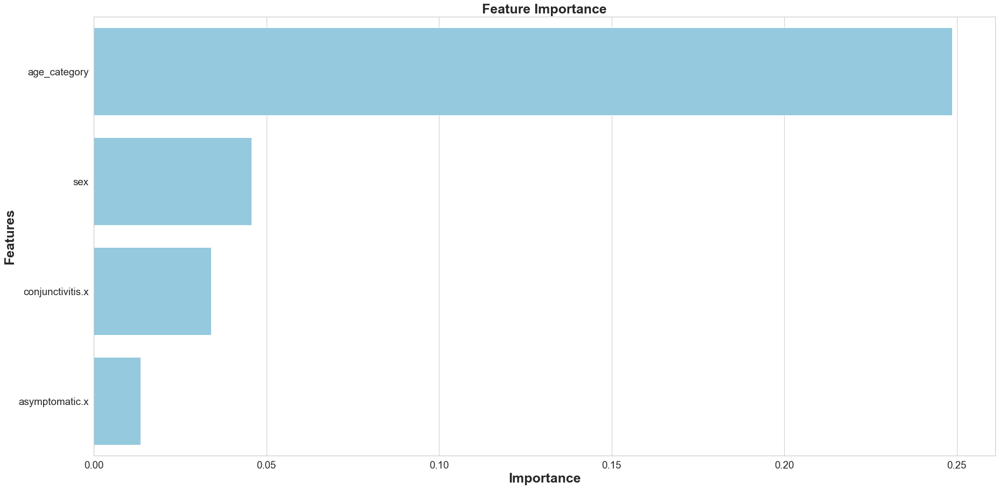

None

,Features,Gini-Importance
0,age_category,0.248689
1,sex,0.045632
2,conjunctivitis.x,0.033978
3,asymptomatic.x,0.013465


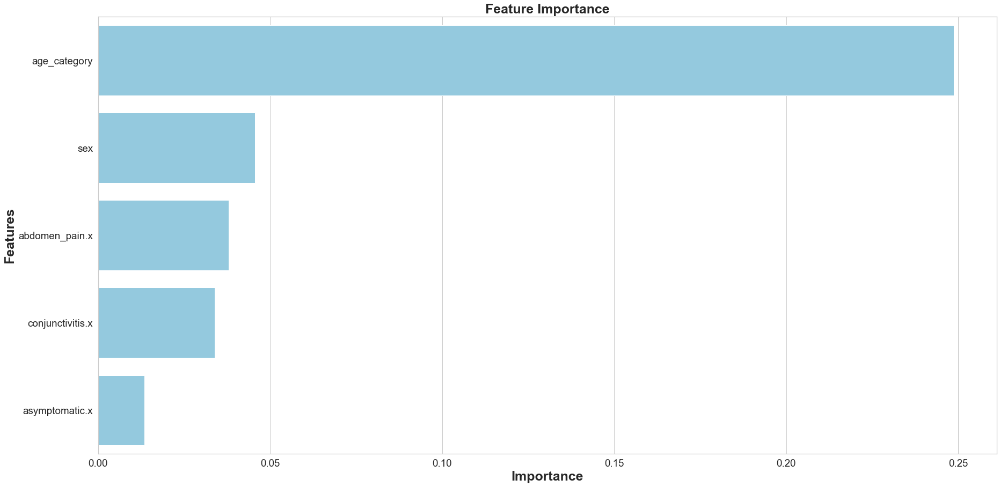

None

,Features,Gini-Importance
0,age_category,0.248689
1,sex,0.045632
2,abdomen_pain.x,0.037955
3,conjunctivitis.x,0.033978
4,asymptomatic.x,0.013465


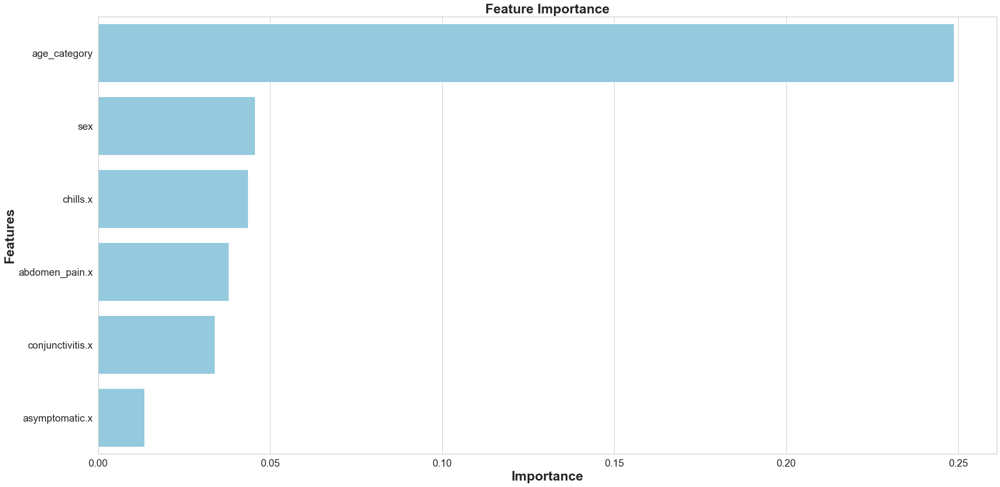

None

,Features,Gini-Importance
0,age_category,0.248689
1,sex,0.045632
2,chills.x,0.043595
3,abdomen_pain.x,0.037955
4,conjunctivitis.x,0.033978
5,asymptomatic.x,0.013465


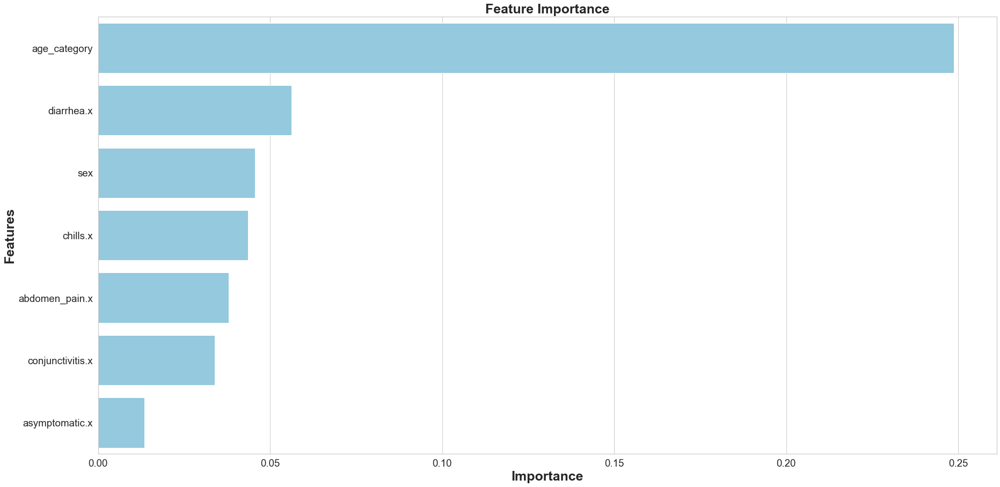

None

,Features,Gini-Importance
0,age_category,0.248689
1,diarrhea.x,0.056147
2,sex,0.045632
3,chills.x,0.043595
4,abdomen_pain.x,0.037955
5,conjunctivitis.x,0.033978
6,asymptomatic.x,0.013465


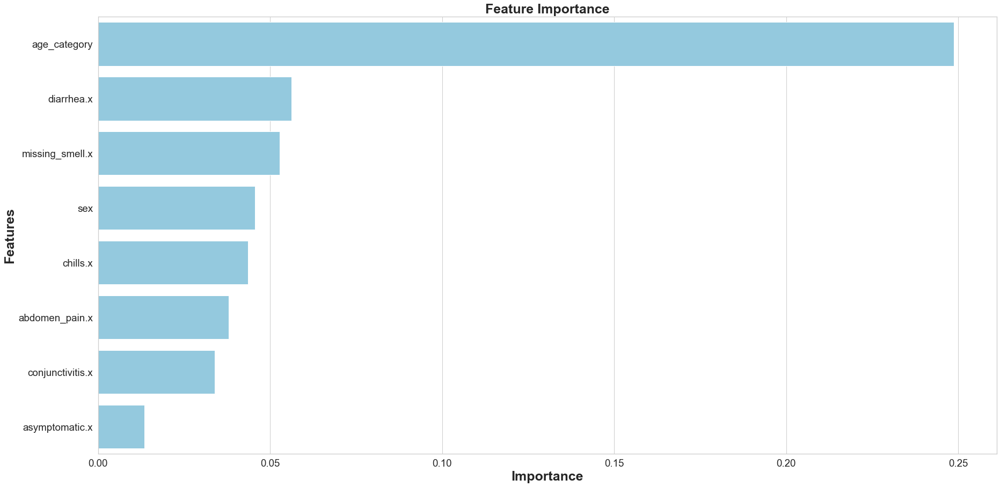

None

,Features,Gini-Importance
0,age_category,0.248689
1,diarrhea.x,0.056147
2,missing_smell.x,0.052845
3,sex,0.045632
4,chills.x,0.043595
5,abdomen_pain.x,0.037955
6,conjunctivitis.x,0.033978
7,asymptomatic.x,0.013465


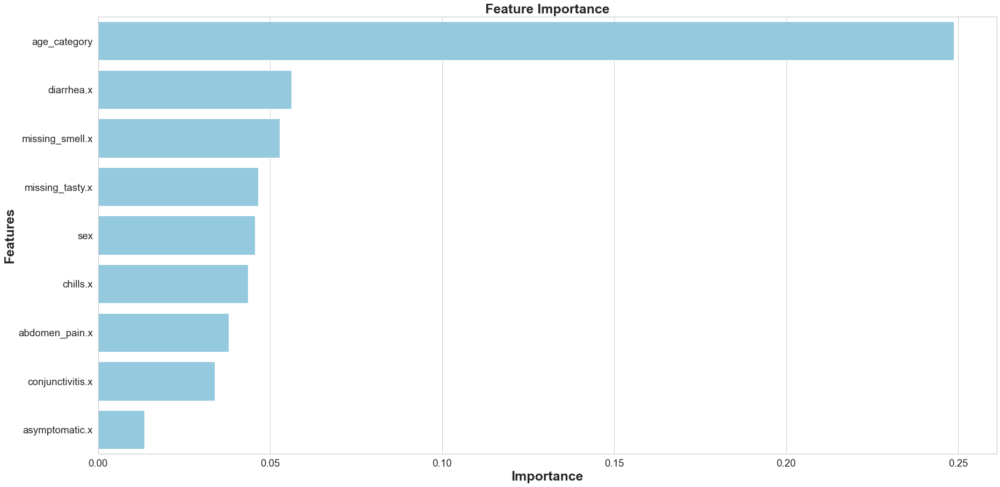

None

,Features,Gini-Importance
0,age_category,0.248689
1,diarrhea.x,0.056147
2,missing_smell.x,0.052845
3,missing_tasty.x,0.046485
4,sex,0.045632
5,chills.x,0.043595
6,abdomen_pain.x,0.037955
7,conjunctivitis.x,0.033978
8,asymptomatic.x,0.013465


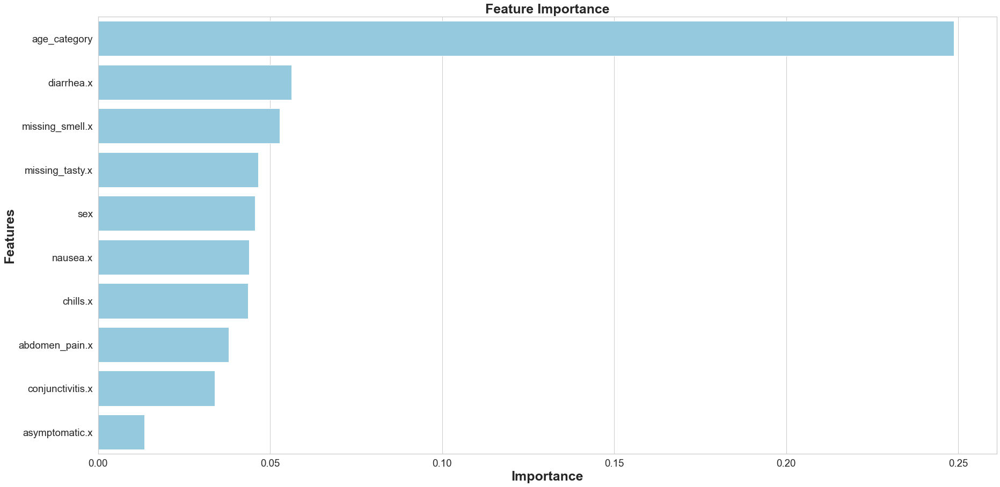

None

,Features,Gini-Importance
0,age_category,0.248689
1,diarrhea.x,0.056147
2,missing_smell.x,0.052845
3,missing_tasty.x,0.046485
4,sex,0.045632
5,nausea.x,0.043945
6,chills.x,0.043595
7,abdomen_pain.x,0.037955
8,conjunctivitis.x,0.033978
9,asymptomatic.x,0.013465


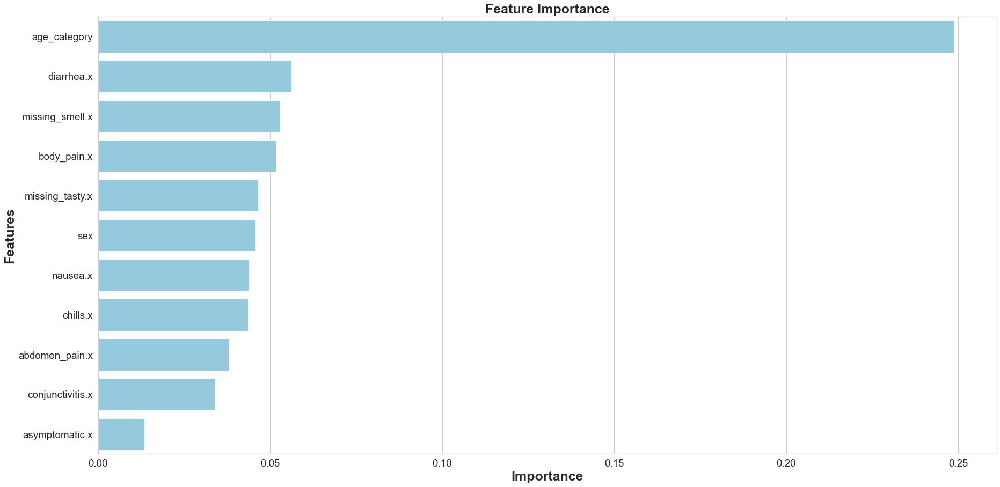

None

,Features,Gini-Importance
0,age_category,0.248689
1,diarrhea.x,0.056147
2,missing_smell.x,0.052845
3,body_pain.x,0.051660
4,missing_tasty.x,0.046485
5,sex,0.045632
6,nausea.x,0.043945
7,chills.x,0.043595
8,abdomen_pain.x,0.037955
9,conjunctivitis.x,0.033978


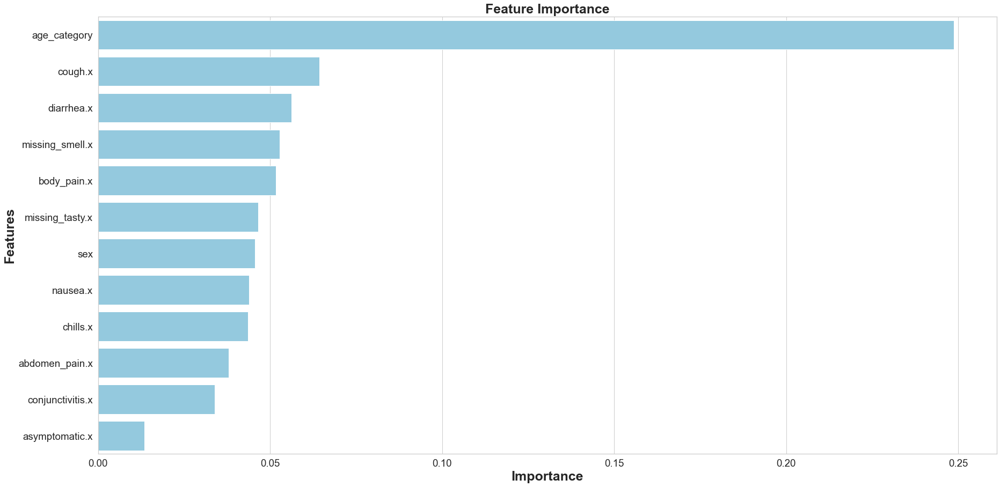

None

,Features,Gini-Importance
0,age_category,0.248689
1,cough.x,0.064399
2,diarrhea.x,0.056147
3,missing_smell.x,0.052845
4,body_pain.x,0.051660
5,missing_tasty.x,0.046485
6,sex,0.045632
7,nausea.x,0.043945
8,chills.x,0.043595
9,abdomen_pain.x,0.037955


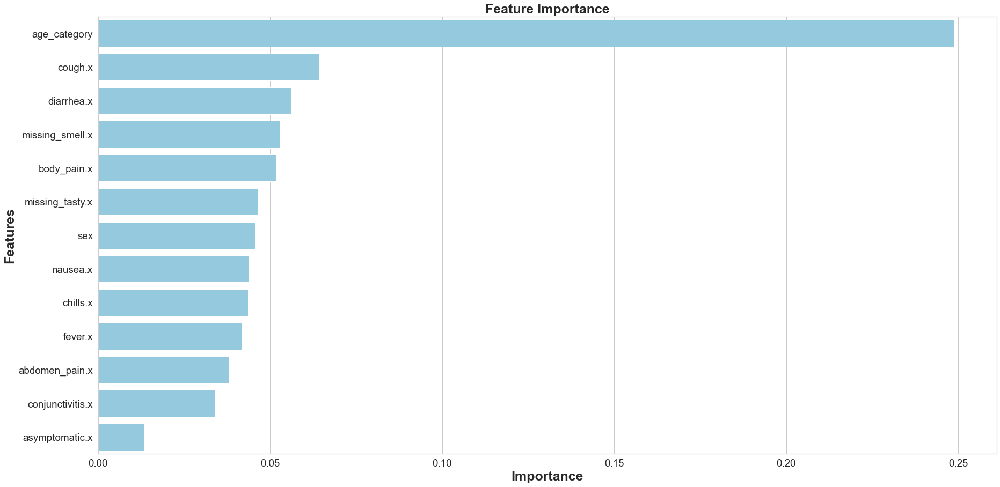

None

,Features,Gini-Importance
0,age_category,0.248689
1,cough.x,0.064399
2,diarrhea.x,0.056147
3,missing_smell.x,0.052845
4,body_pain.x,0.051660
5,missing_tasty.x,0.046485
6,sex,0.045632
7,nausea.x,0.043945
8,chills.x,0.043595
9,fever.x,0.041692


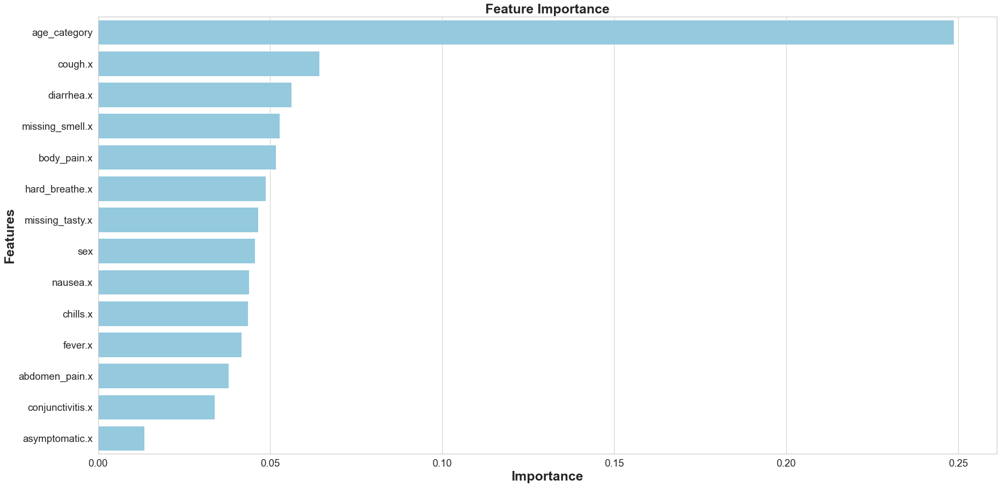

None

,Features,Gini-Importance
0,age_category,0.248689
1,cough.x,0.064399
2,diarrhea.x,0.056147
3,missing_smell.x,0.052845
4,body_pain.x,0.051660
5,hard_breathe.x,0.048793
6,missing_tasty.x,0.046485
7,sex,0.045632
8,nausea.x,0.043945
9,chills.x,0.043595


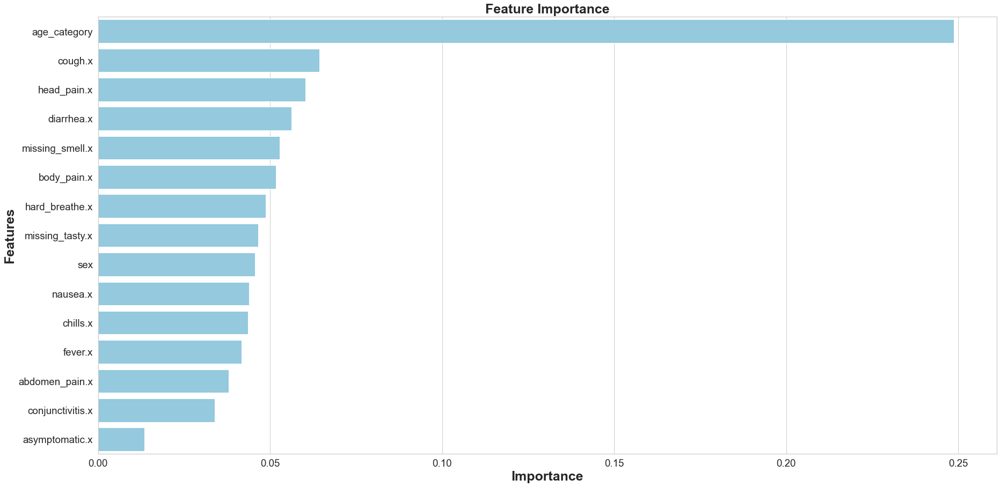

None

,Features,Gini-Importance
0,age_category,0.248689
1,cough.x,0.064399
2,head_pain.x,0.060207
3,diarrhea.x,0.056147
4,missing_smell.x,0.052845
5,body_pain.x,0.051660
6,hard_breathe.x,0.048793
7,missing_tasty.x,0.046485
8,sex,0.045632
9,nausea.x,0.043945


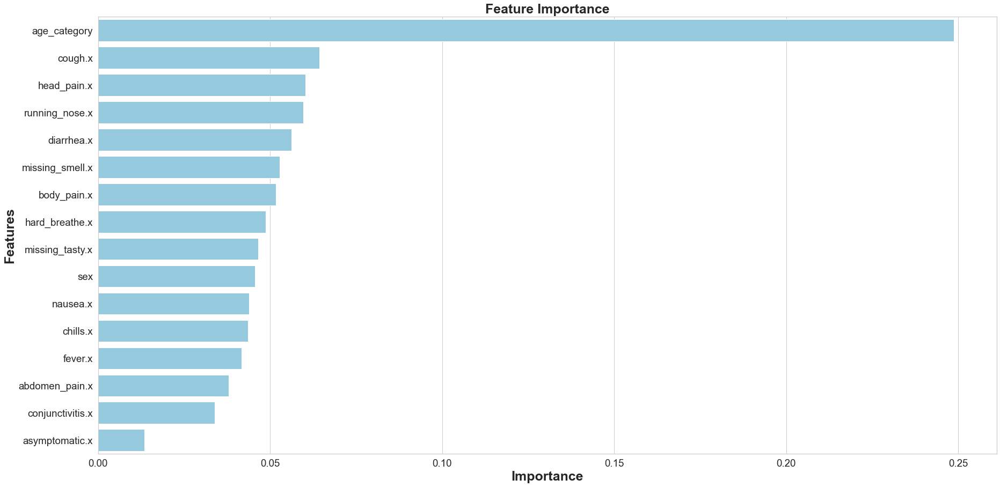

None

,Features,Gini-Importance
0,age_category,0.248689
1,cough.x,0.064399
2,head_pain.x,0.060207
3,running_nose.x,0.059643
4,diarrhea.x,0.056147
5,missing_smell.x,0.052845
6,body_pain.x,0.051660
7,hard_breathe.x,0.048793
8,missing_tasty.x,0.046485
9,sex,0.045632


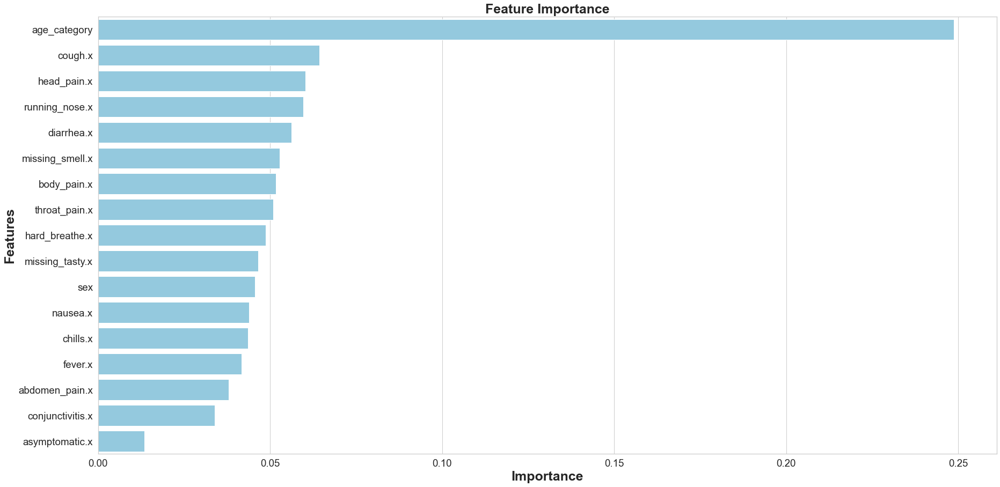

None

,Features,Gini-Importance
0,age_category,0.248689
1,cough.x,0.064399
2,head_pain.x,0.060207
3,running_nose.x,0.059643
4,diarrhea.x,0.056147
5,missing_smell.x,0.052845
6,body_pain.x,0.051660
7,throat_pain.x,0.050870
8,hard_breathe.x,0.048793
9,missing_tasty.x,0.046485


              precision    recall  f1-score   support

           0       0.95      0.72      0.82    369585
           1       0.09      0.41      0.14     23874

    accuracy                           0.70    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.70      0.78    393459

[[264876 104709]
 [ 13983   9891]]


In [177]:
roc_auc_rus1,fpr_rus1,tpr_rus1 , _ = build_and_test(X_res, X_test, y_res, y_test, class_weight = {0:1, 1:ratio}, threshold = True )

# LGT OVERSAMPLER Ajustes 🔱

In [178]:
from sklearn.linear_model import LogisticRegression

In [179]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.feature_selection import RFE
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight =None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = LogisticRegression(class_weight = class_weight)
    if warm_start:
        model = LogisticRegression(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = LogisticRegression()
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
 
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    sensi = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    speci= cm1[1,1]/(cm1[0,1]+cm1[1,1])
    print(cm1[0,0])
    print(cm1[0,1])
    print(cm1[1,0])
    print(cm1[1,1])

    sensi = cm1[1,1]/(cm1[1,1]+cm1[1,0])
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)

    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])

    # importance
    importance = model.coef_[0]
    # summarize
    for i,v in enumerate(importance):
	    print('Feature: %0d, Score: %.5f' % (i,v))

        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show() 
       
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [180]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [181]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750906, 1: 750906})
Testing target statistics: Counter({0: 369734, 1: 23725})


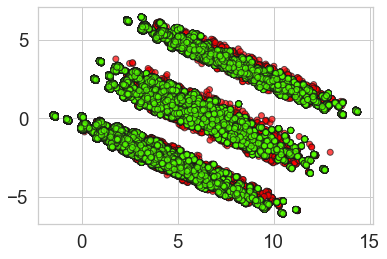

Resultado da prescisão 0.0874887782583857
Resultado do recall 0.4518440463645943
Resultado F1 0.1465932788622611
Resultado acurácia 0.6827750794873163
257924
111810
13005
10720
Sensibilidade:  0.4518440463645943
Especificação:  0.6975934049884511
Feature: 0, Score: 0.21189
Feature: 1, Score: -0.08245
Feature: 2, Score: -0.06426
Feature: 3, Score: -0.09337
Feature: 4, Score: 0.00126
Feature: 5, Score: 0.02461
Feature: 6, Score: 0.00318
Feature: 7, Score: 0.12057
Feature: 8, Score: 0.09913
Feature: 9, Score: 0.00694
Feature: 10, Score: 0.02819
Feature: 11, Score: 0.00826
Feature: 12, Score: 0.07218
Feature: 13, Score: 0.02695
Feature: 14, Score: -0.03362
Feature: 15, Score: -0.04182
Feature: 16, Score: -0.07426


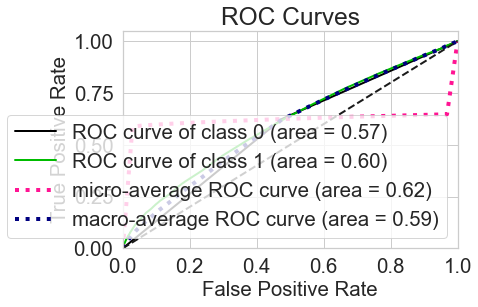

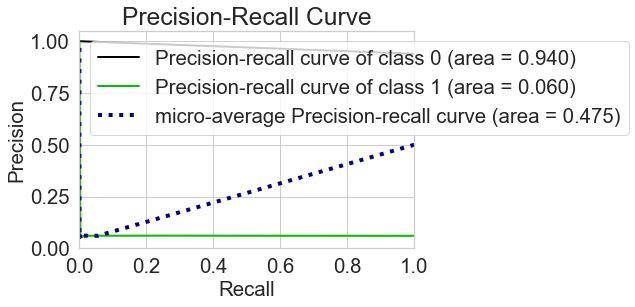

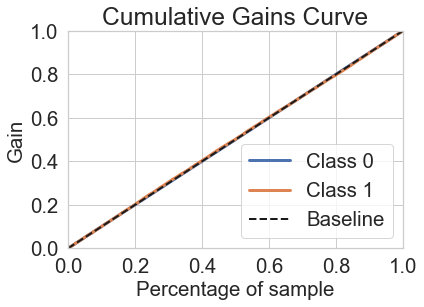

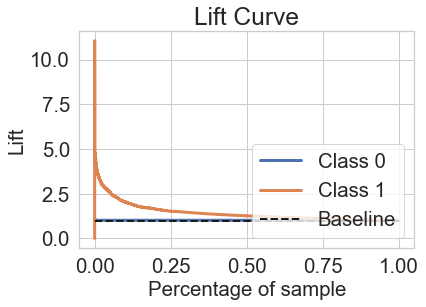

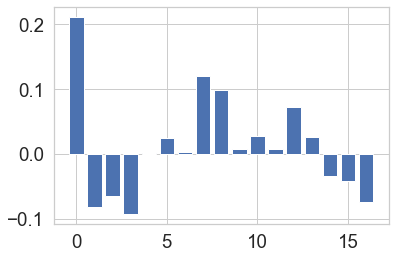

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369734
           1       0.09      0.45      0.15     23725

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.68      0.77    393459

[[257924 111810]
 [ 13005  10720]]


In [182]:
roc_auc_ros2,fpr_ros2,tpr_ros2, _ = build_and_test(X_res, X_test, y_res, y_test, class_weight = {0:1, 1:ratio}, threshold = True)

In [183]:
df1.columns

Index(['age_category', 'sex', 'conjunctivitis.x', 'asymptomatic.x',
       'abdomen_pain.x', 'chills.x', 'diarrhea.x', 'missing_smell.x',
       'missing_tasty.x', 'nausea.x', 'body_pain.x', 'cough.x', 'fever.x',
       'hard_breathe.x', 'head_pain.x', 'running_nose.x', 'throat_pain.x'],
      dtype='object')

# DECISION TREE UNDERSAMPLER Ajustes 🔱

In [184]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report

from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start=False):
    
    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # construindo modelo
    if class_weight:
        model = DecisionTreeClassifier(class_weight = class_weight)
    if warm_start:
        model = DecisionTreeClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = DecisionTreeClassifier()
    model.fit(X_tr, y_tr)
    
    # modelo
    y_pred = model.predict(X_te)
    print('Precision score %s' % precision_score(y_te, y_pred))
    print('Recall score %s' % recall_score(y_te, y_pred))
    print('F1-score score %s' % f1_score(y_te, y_pred))
    print('Accuracy score %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # o melhor threshold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valores que maximizam a estatística J
        best_threshold = thresholds[ix]
        # ajuste de score de acordo com threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
    
    #importance
    importance = model.feature_importances_
    # summarize feature importance
    for i,v in enumerate(importance):
        print('Feature: %0d, Score: %.5f' % (i,v))
    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()
        
    
    # Plot
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_te,y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [185]:
from imblearn.under_sampling import RandomUnderSampler

under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47932, 1: 47932})
Testing target statistics: Counter({0: 369734, 1: 23725})


In [186]:
ratio

15

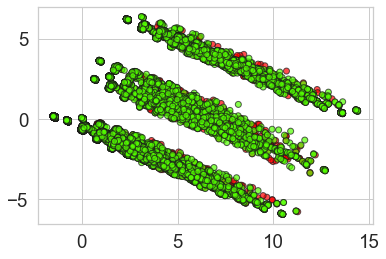

Precision score 0.08319920654944711
Recall score 0.40307692307692305
F1-score score 0.13792854773340257
Accuracy score 0.6961818130986964
Sensibilidade:  0.40307692307692305
Especificação:  0.7149896952944549
Feature: 0, Score: 0.15339
Feature: 1, Score: 0.02732
Feature: 2, Score: 0.04319
Feature: 3, Score: 0.01826
Feature: 4, Score: 0.04065
Feature: 5, Score: 0.06543
Feature: 6, Score: 0.06038
Feature: 7, Score: 0.11652
Feature: 8, Score: 0.04666
Feature: 9, Score: 0.06033
Feature: 10, Score: 0.05702
Feature: 11, Score: 0.06477
Feature: 12, Score: 0.02822
Feature: 13, Score: 0.04766
Feature: 14, Score: 0.05502
Feature: 15, Score: 0.07123
Feature: 16, Score: 0.04395


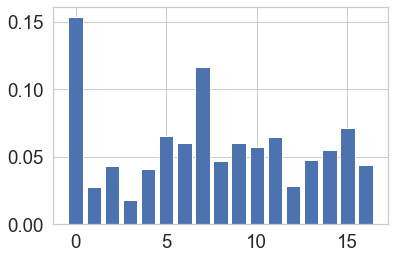

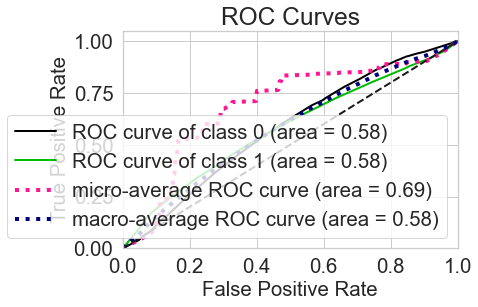

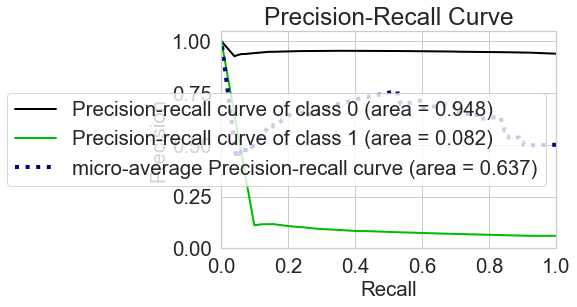

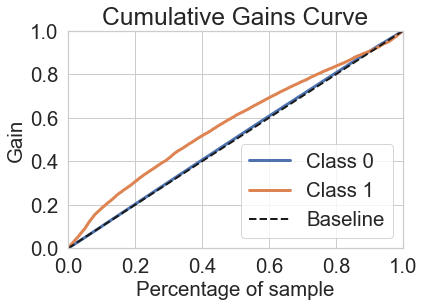

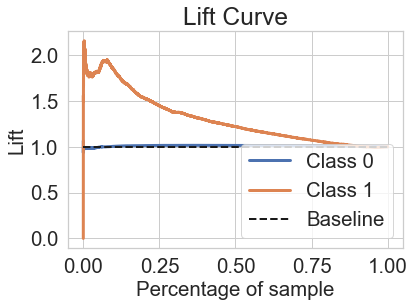

[[264356 105378]
 [ 14162   9563]]
              precision    recall  f1-score   support

           0       0.95      0.71      0.82    369734
           1       0.08      0.40      0.14     23725

    accuracy                           0.70    393459
   macro avg       0.52      0.56      0.48    393459
weighted avg       0.90      0.70      0.77    393459



In [187]:
roc_auc_rus3,fpr_rus3,tpr_rus3 , _ = build_and_test(X_res, X_test, y_res, y_test)

# RANDOM FOREST NEAR MISS Ajustes 🔱

In [188]:
import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy'),
    if warm_start:
        model = RandomForestClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    features1 =  model.feature_importances_

    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    feats = {}
    for feature, importance in zip(df1.columns, features1):
        feats[feature] = importance
        importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
        importances = importances.sort_values(by='Gini-Importance', ascending=False)
        importances = importances.reset_index()
        importances = importances.rename(columns={'index': 'Features'})
        sns.set(font_scale = 5)
        sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
        fig, ax = plt.subplots()
        fig.set_size_inches(30,15)
        sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
        plt.xlabel('Importance', fontsize=25, weight = 'bold')
        plt.ylabel('Features', fontsize=25, weight = 'bold')
        plt.title('Feature Importance', fontsize=25, weight = 'bold')
        display(plt.show())
        display(importances)
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [189]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47932, 1: 47932})
Testing target statistics: Counter({0: 369734, 1: 23725})


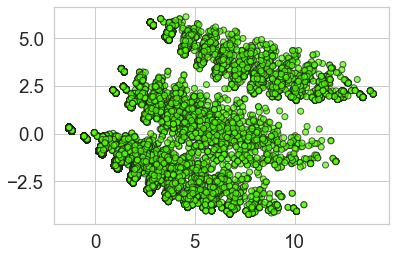

Resultado da prescisão 0.0648337666648227
Resultado do recall 0.5433930453108535
Resultado F1 0.11584565893283971
Resultado acurácia 0.49985131868885957
Sensibilidade:  0.5433930453108535
Especificação:  0.49705734392833767


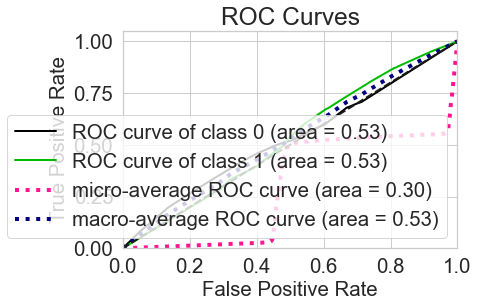

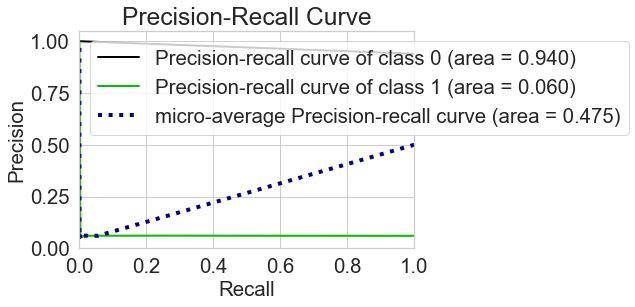

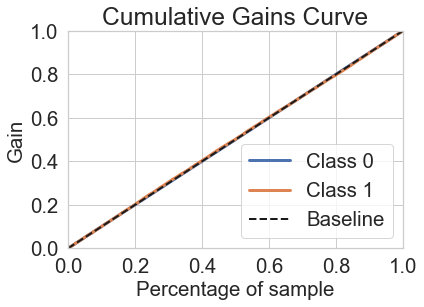

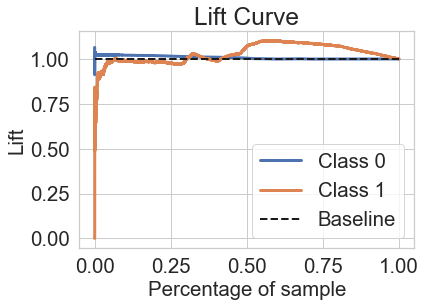

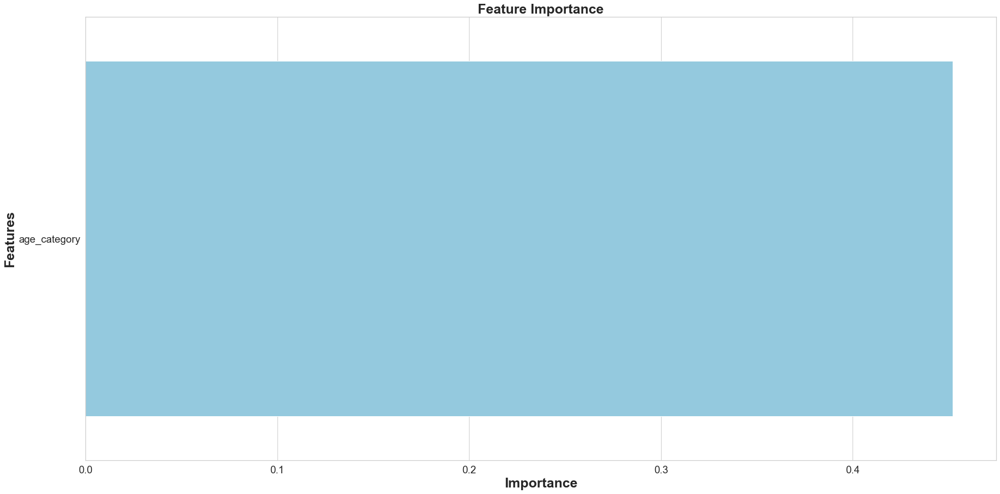

None

,Features,Gini-Importance
0,age_category,0.452198


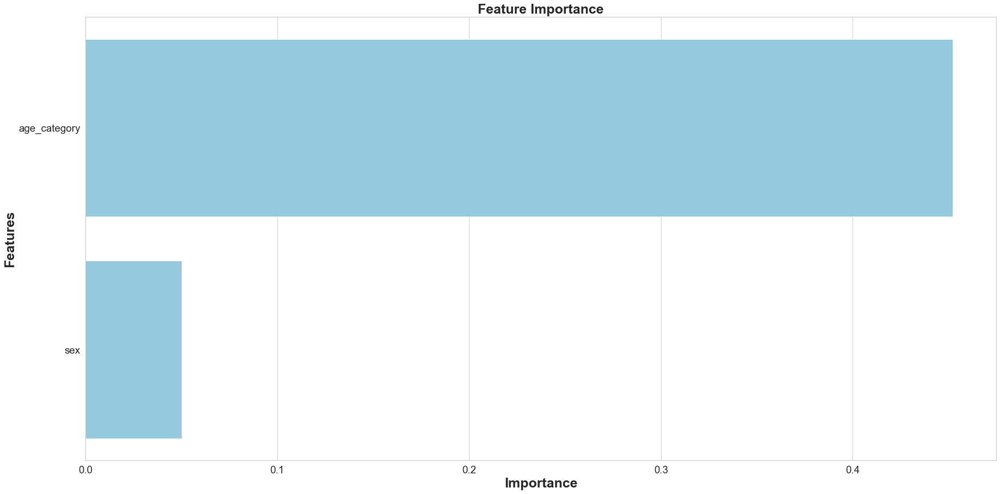

None

,Features,Gini-Importance
0,age_category,0.452198
1,sex,0.050200


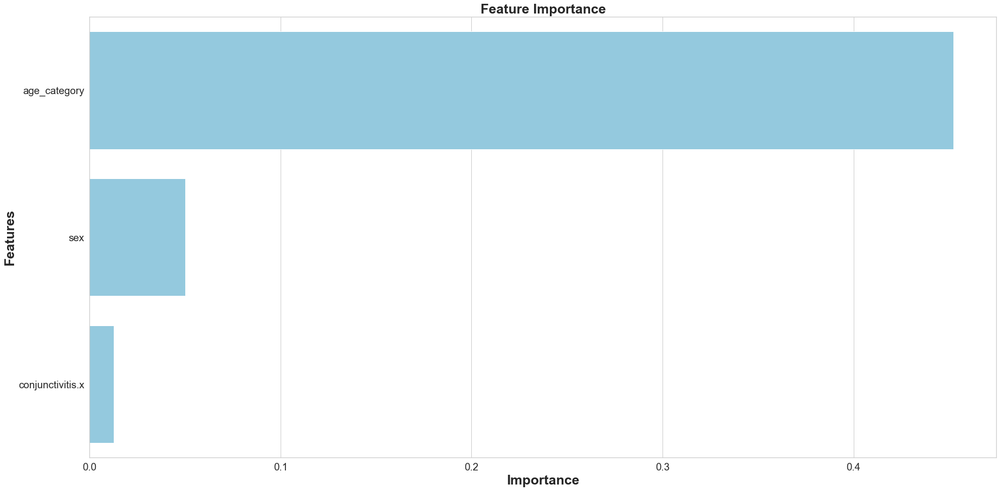

None

,Features,Gini-Importance
0,age_category,0.452198
1,sex,0.050200
2,conjunctivitis.x,0.012620


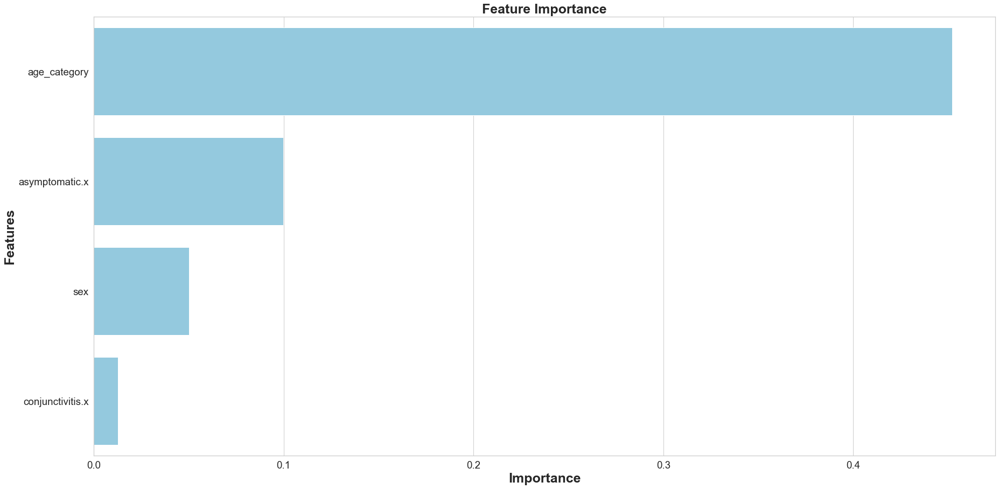

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,conjunctivitis.x,0.012620


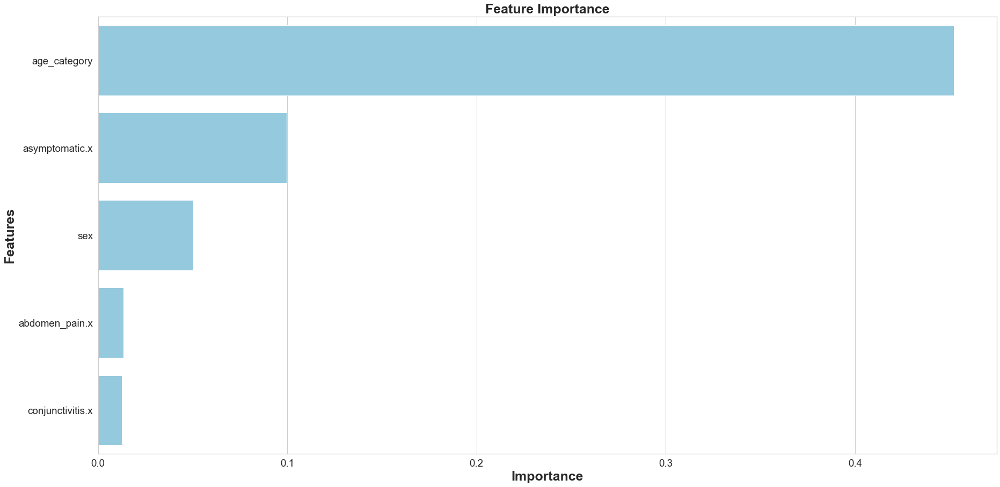

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,abdomen_pain.x,0.013473
4,conjunctivitis.x,0.012620


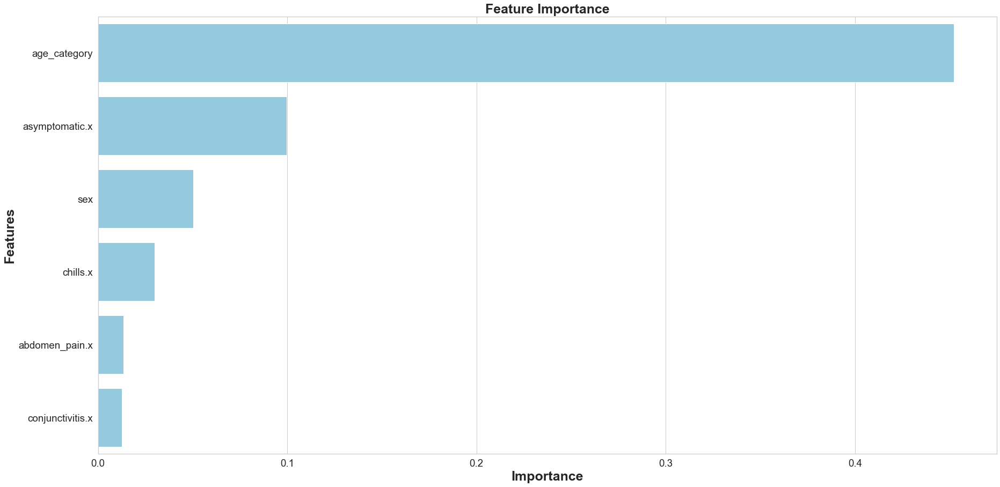

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,chills.x,0.029830
4,abdomen_pain.x,0.013473
5,conjunctivitis.x,0.012620


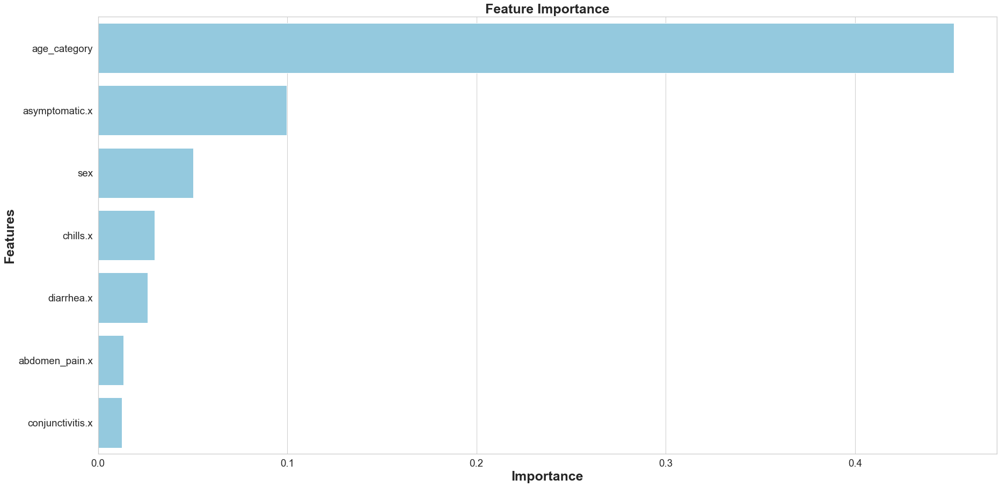

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,chills.x,0.029830
4,diarrhea.x,0.026305
5,abdomen_pain.x,0.013473
6,conjunctivitis.x,0.012620


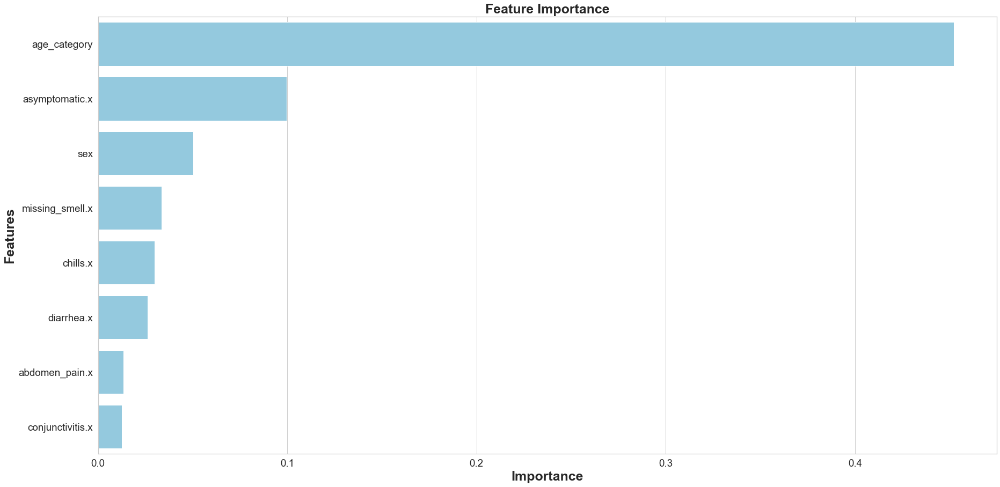

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_smell.x,0.033539
4,chills.x,0.029830
5,diarrhea.x,0.026305
6,abdomen_pain.x,0.013473
7,conjunctivitis.x,0.012620


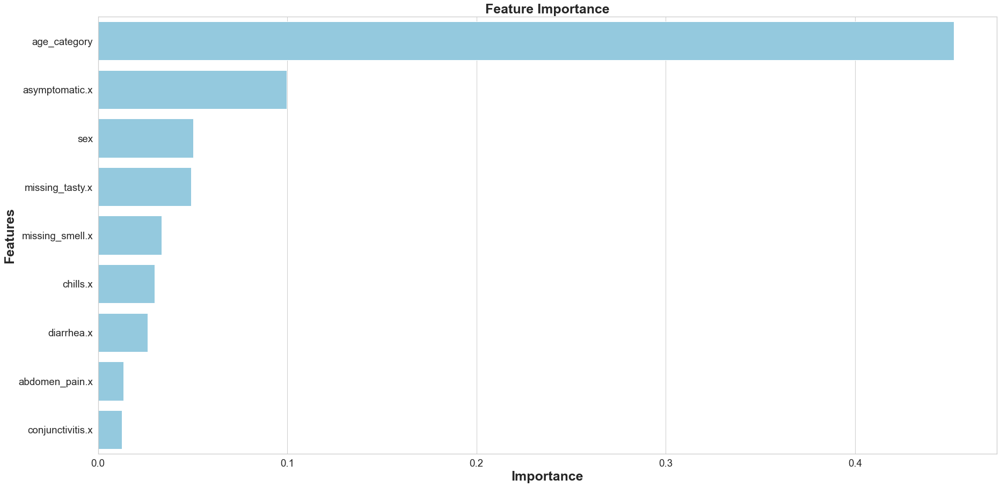

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,missing_smell.x,0.033539
5,chills.x,0.029830
6,diarrhea.x,0.026305
7,abdomen_pain.x,0.013473
8,conjunctivitis.x,0.012620


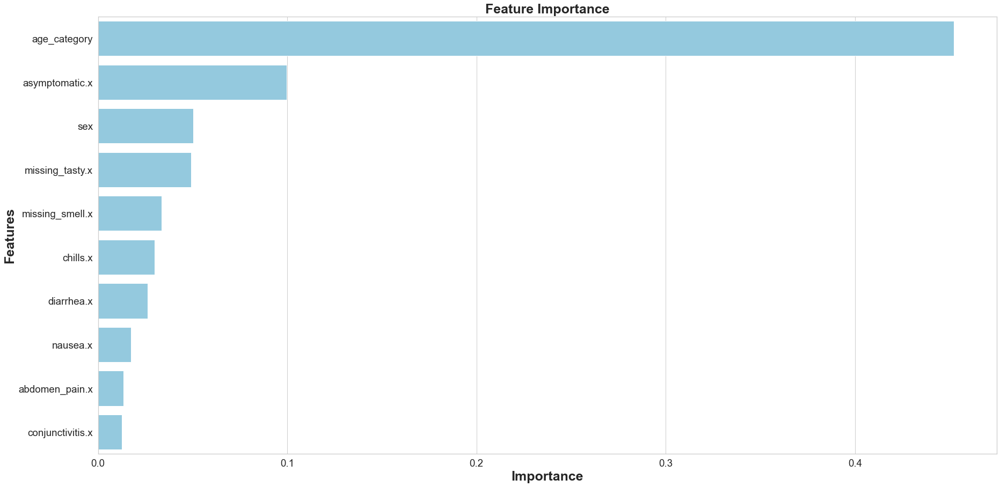

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,missing_smell.x,0.033539
5,chills.x,0.029830
6,diarrhea.x,0.026305
7,nausea.x,0.017463
8,abdomen_pain.x,0.013473
9,conjunctivitis.x,0.012620


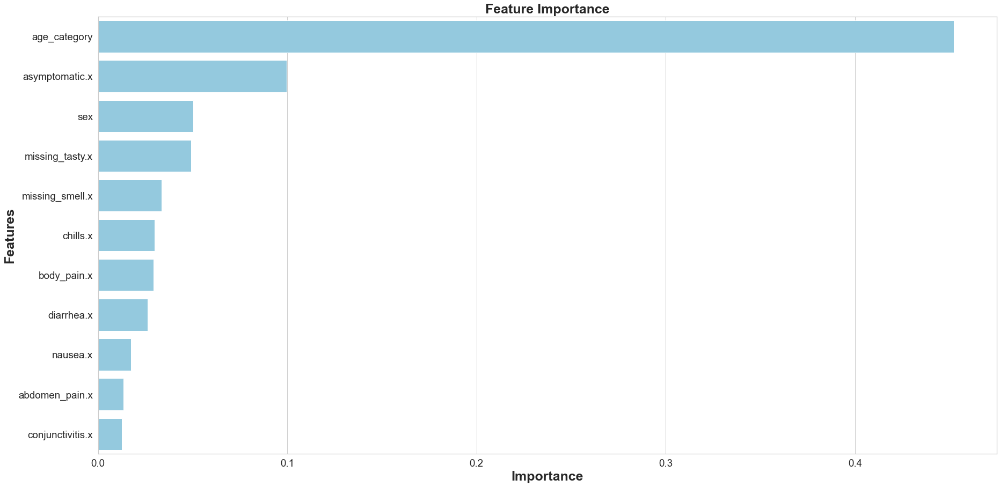

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,missing_smell.x,0.033539
5,chills.x,0.029830
6,body_pain.x,0.029398
7,diarrhea.x,0.026305
8,nausea.x,0.017463
9,abdomen_pain.x,0.013473


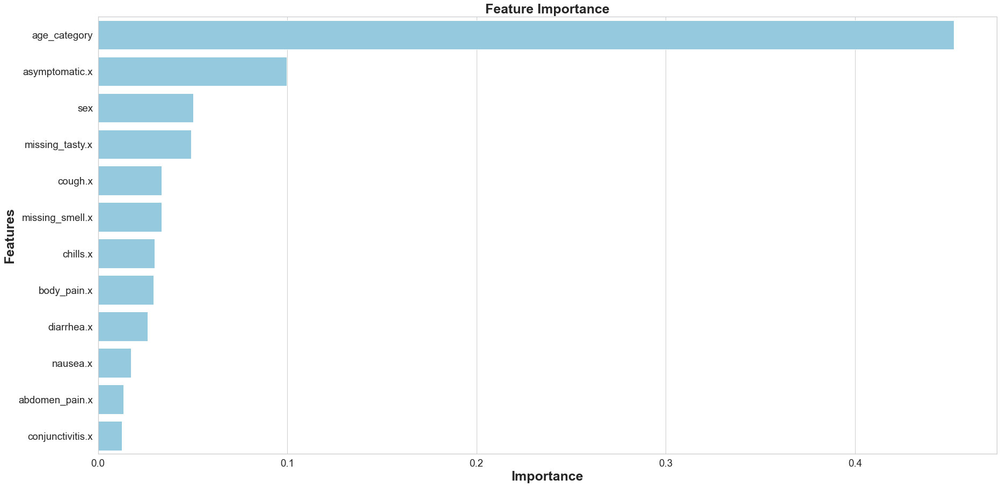

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,cough.x,0.033577
5,missing_smell.x,0.033539
6,chills.x,0.029830
7,body_pain.x,0.029398
8,diarrhea.x,0.026305
9,nausea.x,0.017463


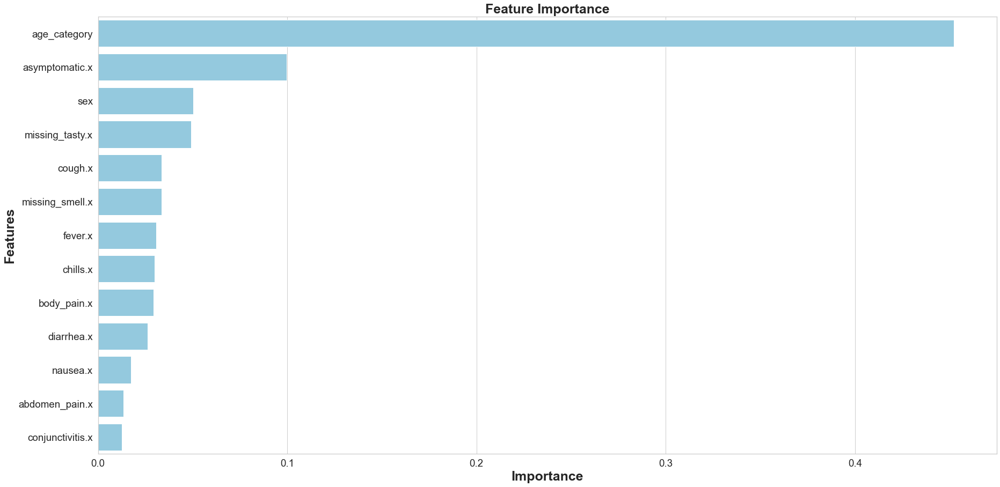

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,cough.x,0.033577
5,missing_smell.x,0.033539
6,fever.x,0.030686
7,chills.x,0.029830
8,body_pain.x,0.029398
9,diarrhea.x,0.026305


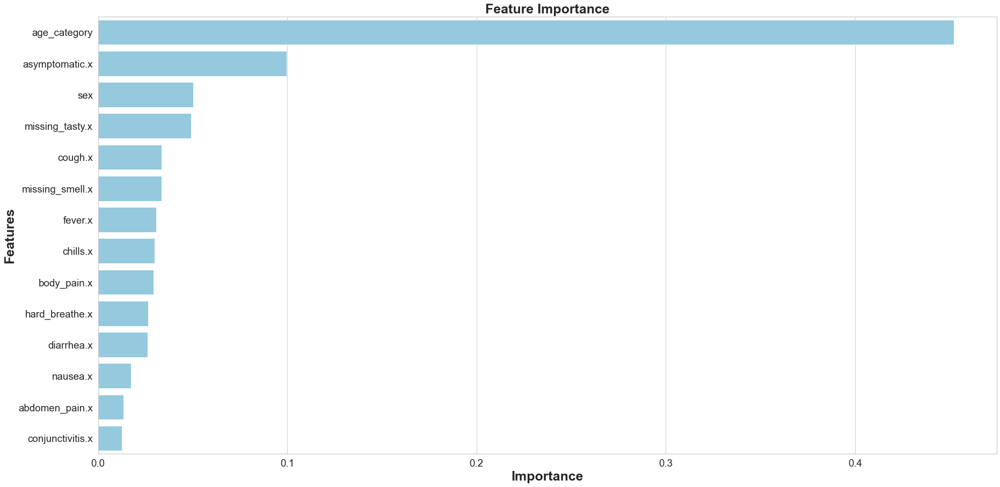

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,cough.x,0.033577
5,missing_smell.x,0.033539
6,fever.x,0.030686
7,chills.x,0.029830
8,body_pain.x,0.029398
9,hard_breathe.x,0.026366


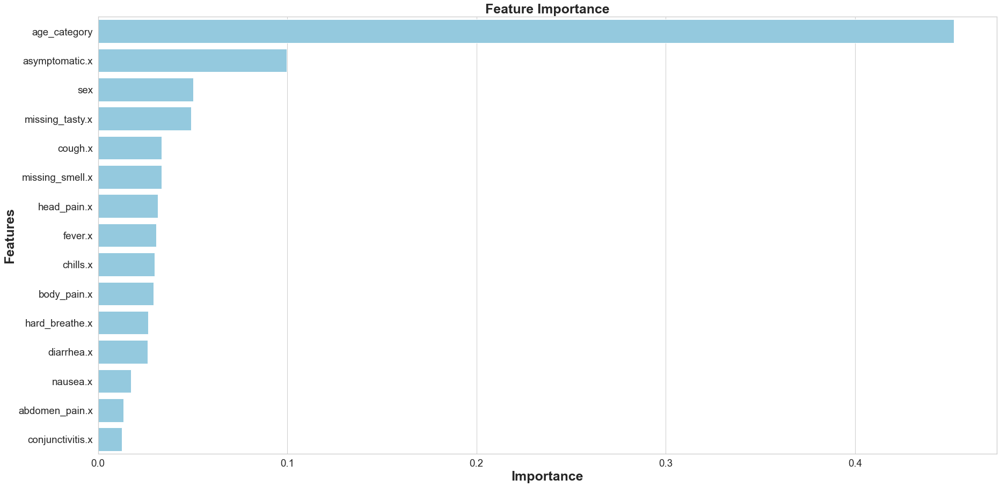

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,cough.x,0.033577
5,missing_smell.x,0.033539
6,head_pain.x,0.031623
7,fever.x,0.030686
8,chills.x,0.029830
9,body_pain.x,0.029398


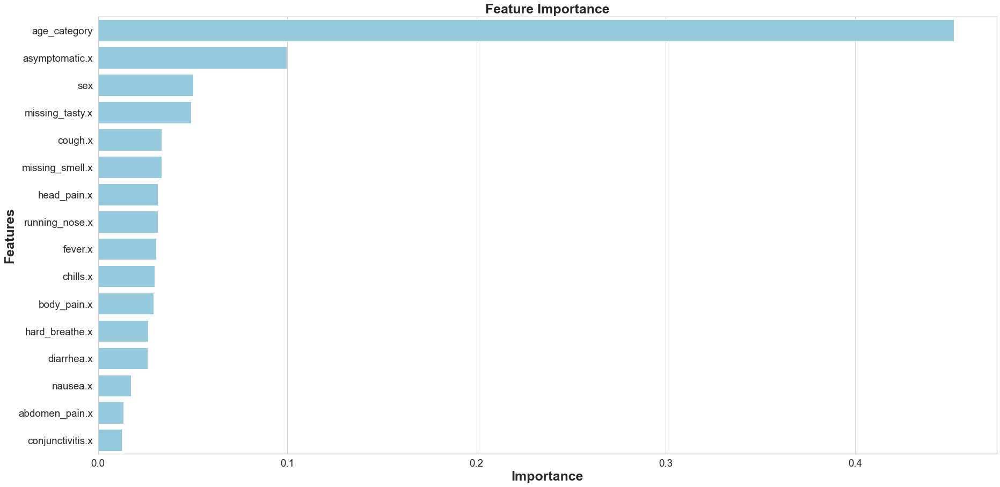

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,cough.x,0.033577
5,missing_smell.x,0.033539
6,head_pain.x,0.031623
7,running_nose.x,0.031603
8,fever.x,0.030686
9,chills.x,0.029830


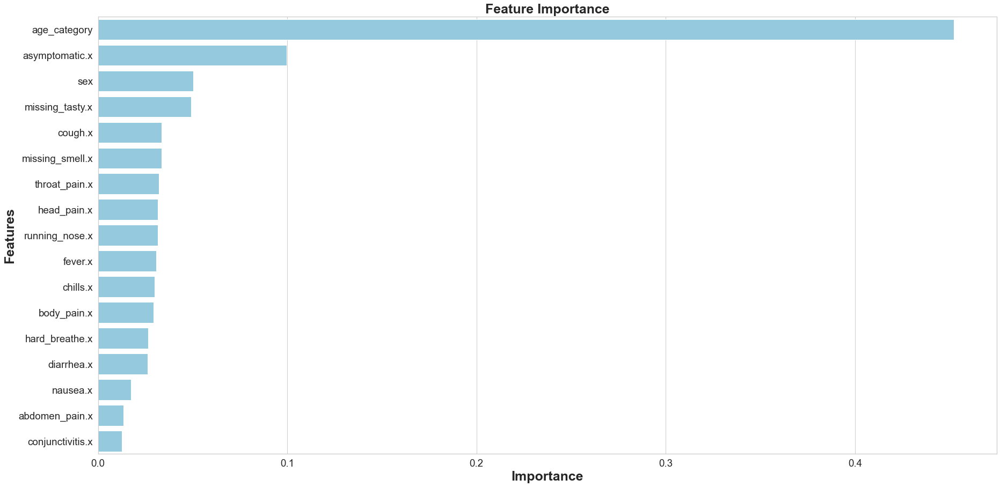

None

,Features,Gini-Importance
0,age_category,0.452198
1,asymptomatic.x,0.099811
2,sex,0.050200
3,missing_tasty.x,0.049249
4,cough.x,0.033577
5,missing_smell.x,0.033539
6,throat_pain.x,0.032058
7,head_pain.x,0.031623
8,running_nose.x,0.031603
9,fever.x,0.030686


              precision    recall  f1-score   support

           0       0.94      0.50      0.65    369734
           1       0.06      0.54      0.12     23725

    accuracy                           0.50    393459
   macro avg       0.50      0.52      0.38    393459
weighted avg       0.89      0.50      0.62    393459

[[183779 185955]
 [ 10833  12892]]


In [190]:
roc_auc_nm1,fpr_nm1,tpr_nm1, _  = build_and_test(X_res, X_test, y_res, y_test)

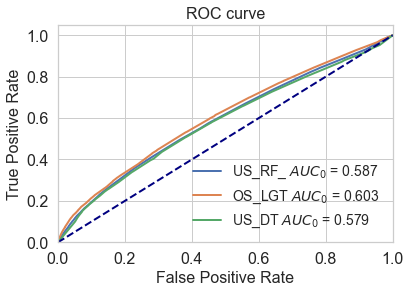

In [191]:
plt.plot(fpr_rus1, tpr_rus1, lw=2, label='US_RF_ $AUC_0$ = %.3f' % (roc_auc_rus1))
plt.plot(fpr_ros2, tpr_ros2, lw=2, label='OS_LGT $AUC_0$ = %.3f' % (roc_auc_ros2))
plt.plot(fpr_rus3, tpr_rus3, lw=2, label='US_DT $AUC_0$ = %.3f' % (roc_auc_rus3))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()